# Introduction into omics data

## Summary:
1. Single-Cell Analysis
2. Differential Expression Analysis
3. snRNA-seq Analysis
4. snATAC-seq Analysis

#*Helpful links*
AnnData is the main object used, containing Pandas dataframes for describing observations and variables (.obs and .var), the data itself (.X), and dimensionality reductions (.obsm and .varm).

https://anndata.readthedocs.io/en/latest/

Best-practices: https://www.sc-best-practices.org/introduction/prior_art.html

Here is the ScanPy tutorial for clustering, which may be helpful for (1).

https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html


https://pydeseq2.readthedocs.io/en/latest/ will be used for some of the differential expression in problem 2.

Using https://muon-tutorials.readthedocs.io/en/latest/single-cell-rna-atac/pbmc10k/2-Chromatin-Accessibility-Processing.html may help for the snATAC-seq portion, mostly for QC...

In [91]:
import os, gc
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from matplotlib.pyplot import rc_context
import anndata
import scanpy as sc
from muon import atac as ac
from plotnine import (
    ggplot,
    aes,
    scale_x_log10,
    scale_y_log10,
    geom_point,
    geom_violin,
    geom_boxplot,
    geom_jitter,
    theme_matplotlib,
    theme_set,
)
from gprofiler import GProfiler
from pyjaspar import jaspardb
import Bio
from typing import List

from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats

from scipy.sparse import diags, isspmatrix_csr

MOTIF_LIST = jaspardb(release="JASPAR2024").fetch_motifs(collection="CORE", tax_group=["vertebrates"], species=9606)

theme_set(theme_matplotlib())
sc.set_figure_params(dpi_save=600, dpi=150, frameon=False)
sc.settings.verbosity=2
sc.settings.figdir="."

# **1. Single-Cell Cell Type Inference**

We can classify cells based on their gene expression profiles using techniques like RNA sequencing (RNA-seq).

### Role of RNA-Seq in Cell Classification
We want to infer cell types by analyzing gene expression patterns. In the wet-lab, RNA-seq involves extracting RNA, converting it into cDNA, and sequencing it to analyze gene expression. Experimental methods: FACS, microfluidics, droplet-based

**General idea about scRNA analysis:**
- Introduce barcode: adapter -- barcode (10-12 bp) -- UMI (unique molecular identifier, 10 bp) -- polyT
- Every cell togethere with barcode injected into oil droplet
- Reverse trascription in droplet, from mRNA to cDNA
- Amplification
-Differetiation of mDAN based on barcode and UMI

**Idea befine sc RNA-seq**:
Cells that have different function are characterized by different set of RNA expressed, quantitatively.

### RNA-seq & Alzheimer's Research

Alzheimer's disease affects certain types of brain cells more severely than others, such as specific neuron subtypes. RNA-seq can help identify these vulnerable cell types by showing which cells express Alzheimer’s-related genes more than others, or reveal upregulation or downregulation of genes that may contribute to Alzheimer’s pathology, such as those involved in amyloid-beta production or tau protein phosphorylation.

# **1. Single-cell RNA-seq cell type annotation**

Data analysis of single-nucleus RNA sequencing (snRNA-seq) from postmortem human cortex samples of Alzheimer's disease patients. The initial dataset is stored in an H5AD object, a format designed for efficient storage of sparse matrices commonly found in single-cell RNA-seq experiments. The initial H5AD object was processed using [this script](https://gist.github.com/benjamin-james/b4ebd6c5182f45f290d21a89091e3043).

That part closely follows the 'Preprocessing and visualization' and 'Identifying cellular structure' chapters of https://www.sc-best-practices.org/preprocessing_visualization/quality_control.html

Steps:
- Familirize with Adata format, layers, obs, and var.
- Filtering out low quality cells and normalization
- Check for dublets: droplets where two mRNA istead of one occuired
- Batch correction - reduce the difference between experimental batches
- Dimentiality reduction (UMAP) and embeddings from PCA.

In [22]:
def download_dataset():
  """
  Download and load the single-cell RNA sequencing dataset as an AnnData object.

    The dataset is retrieved from a specified URL and loaded into an AnnData object,
    which is designed to store annotated data matrices in the context of single-cell
    genomics. The AnnData format facilitates handling large datasets typical in
    high-throughput biology with efficient data manipulation and analysis capabilities.

    Returns:
    --------
    adata : AnnData
        An AnnData object containing the downloaded single-cell RNA-seq data. Key components include:

        - .X : A data matrix (cells × genes) of gene expression values, typically counts or normalized counts.
        - .obs : DataFrame with one row per cell and columns for various cell-level annotations.
        - .var : DataFrame with one row per gene and columns for various gene-level annotations.
        - .uns : Unstructured dictionary-like attribute for miscellaneous data related to the dataset.
        - .obsm : Dictionary-like structure for storing arrays that annotate observations (cells).
        - .varm : Dictionary-like structure for storing arrays that annotate variables (genes).
        - .obsp : Pairwise annotation of observations as a sparse matrix.
        - .varp : Pairwise annotation of variables as a sparse matrix.
  """
  !wget -c https://compbio.mit.edu/benjames/MFC_RNA.h5ad -O MFC_RNA.h5ad
  adata = anndata.read_h5ad("MFC_RNA.h5ad", backed="r")
  return adata

adata = download_dataset()

--2025-07-06 22:59:54--  https://compbio.mit.edu/benjames/MFC_RNA.h5ad
Resolving compbio.mit.edu (compbio.mit.edu)... 128.52.131.233
Connecting to compbio.mit.edu (compbio.mit.edu)|128.52.131.233|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.



In [9]:
adata

AnnData object with n_obs × n_vars = 182027 × 36601 backed at 'MFC_RNA.h5ad'
    obs: 'library_id', 'subject', 'msex', 'age_death', 'pmi', 'race', 'Pathologic_diagnosis_of_AD', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_chrX', 'log1p_total_counts_chrX', 'pct_counts_chrX', 'total_counts_chrY', 'log1p_total_counts_chrY', 'pct_counts_chrY', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'gene_length', 'strand', 'interval', 'chrX', 'chrY', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std'
    uns: 'neighbors', 'pca', 'scrublet', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

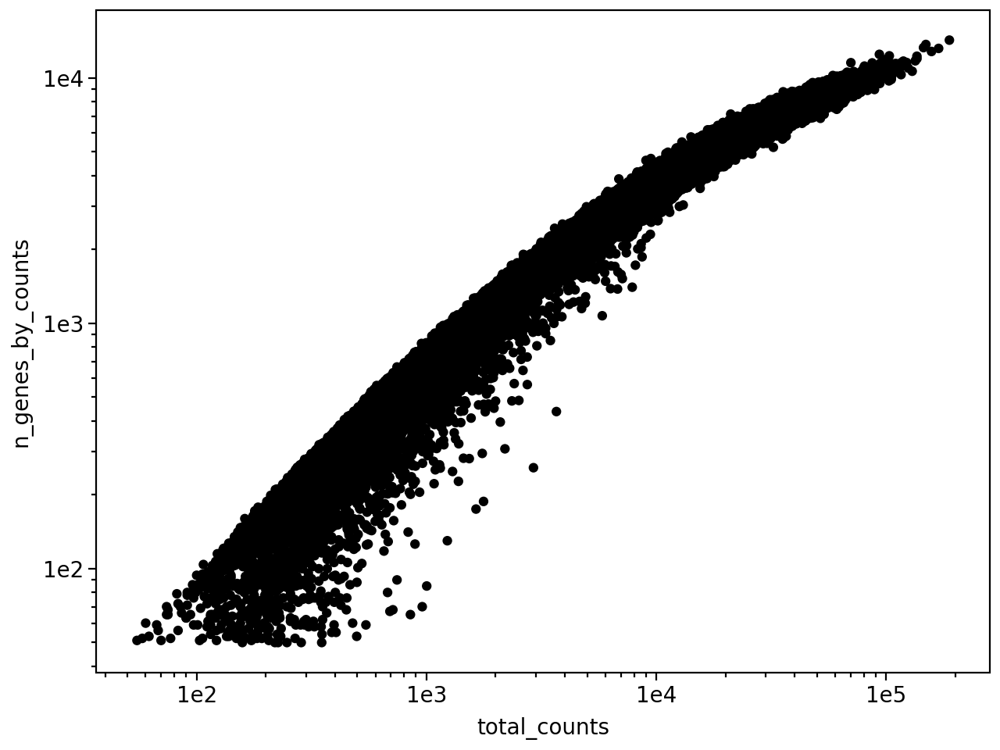

In [6]:
ggplot(adata.obs, aes(y="n_genes_by_counts", x="total_counts")) + geom_point() + scale_x_log10() + scale_y_log10()

The plot shows relation: total counts per cell vs number of non-zero-count genes. We expect high correlation. When the saturation becomes prominant - small portion of genes contribute extensively to the total counts. We want the filter out, since they can be associated with anomalies in mitochondria expression, etc.

## 1.1 Doublet finding: Data cleaning

**RNA-seq Primer**

In single-cell RNA sequencing (scRNA-seq), the goal is to capture the RNA from individual cells. In droplet-based scRNA-seq, individual cells are encapsulated into tiny droplets along with a barcode and reagents that help capture their RNA. Each droplet typically contains one cell, and the barcode ensures that the RNA from each cell is labeled uniquely, allowing researchers to track the gene expression of individual cells.

Sometimes, two cells accidentally get captured in the same droplet. This creates a doublet, meaning that RNA from both cells is merged and tagged as if it came from a single cell. Doublets can confuse the analysis because they appear to express genes from two different cell types.

Tools like [Scrublet](https://www.cell.com/cell-systems/fulltext/S2405-4712(18)30474-5) simulate these by taking random pairs of observed transcriptomes and simulating what doublets look like.

**Scrublet In Simple Terms**

Scrublet has three steps:

1. Simulating Doublets: Scrublet takes the RNA data from your cells and starts by randomly pairing up actual cells in your dataset. This simulates what it would look like if two cells had accidentally been sequenced together as one (a doublet).

2. Comparing Real Cells to Simulated Doublets: Once it has simulated these doublets, Scrublet compares each real cell to the simulated doublets. If a real cell looks very similar to one of the simulated doublets (in terms of its gene expression), it is flagged as a potential doublet.

3. Scoring: Scrublet assigns a doublet score to each cell. A higher score means it’s more likely the cell is a doublet.

By running Scrublet, we can identify and remove these doublets, ensuring that only high-quality, single-cell data is used for analysis.







The doublets cluster together but number of agglomerations are visible. That can point out probability of different cell pairs be found together. At the same, the high number of doublet clusters assums that there are many such combinations.

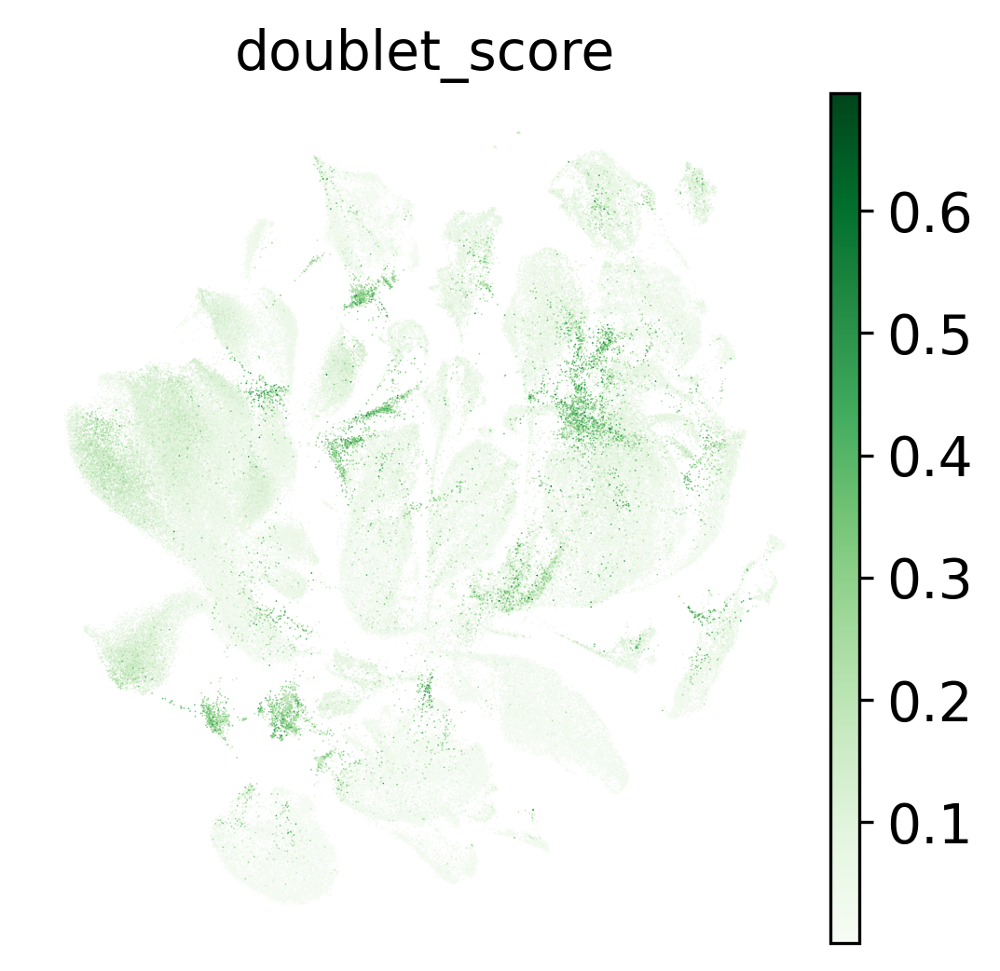

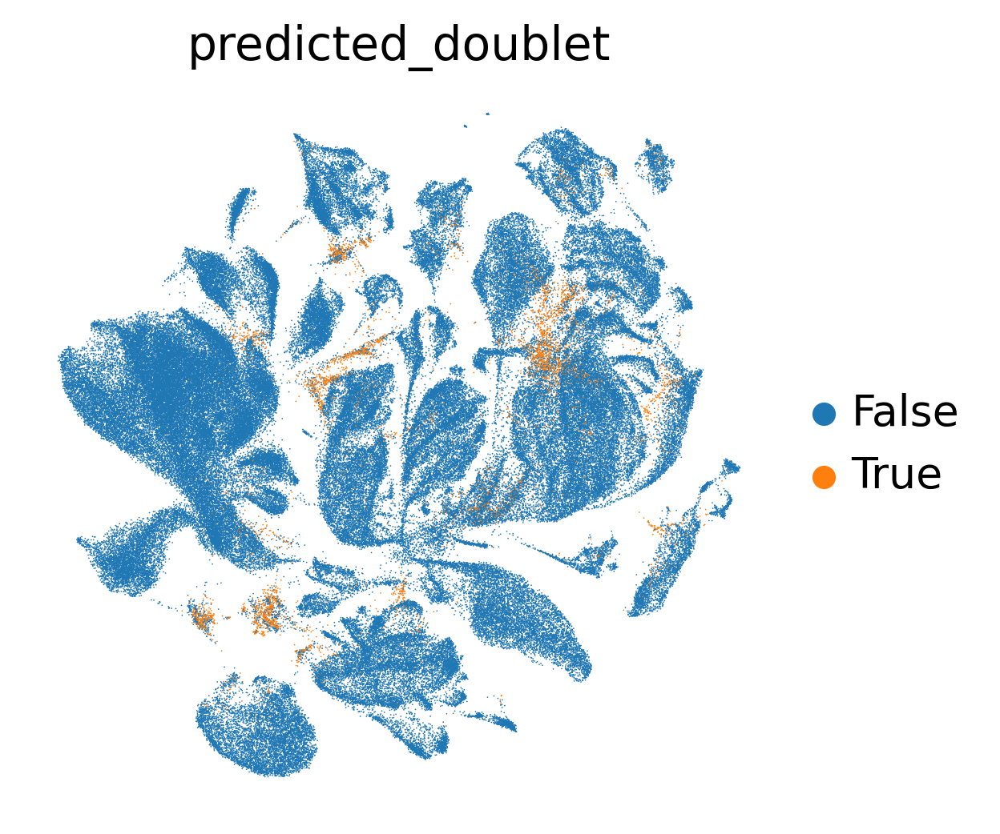

In [10]:
sc.pl.umap(adata, color="doublet_score", color_map="Greens")
sc.pl.umap(adata, color="predicted_doublet")

When running Scrublet we can provide simulated doublets or run without them `sc.pp.scrublet(adata, batch_key="library_id")`. Be aware, scanpy run transformations inplace, if you don't want default behavior - use `adata.copy()`
Below we compare behavior with simulated doublets and without. Be sure to use `batch_key` as a group key.

In [ ]:
def simulate_doublets(adata: anndata.AnnData, sim_doublet_ratio: float = 2.0) -> anndata.AnnData:
  """
  Simulate doublets by randomly sampling pairs of cells from the given AnnData object
  and adding their gene expression counts together.

  Parameters:
  -----------
  adata : AnnData
      The input AnnData object containing the single-cell RNA-seq data. This contains the
      cell-by-gene matrix (.X), along with gene and cell metadata (.var and .obs).

  sim_doublet_ratio : float, optional (default=2.0)
      The ratio of simulated doublets to the number of real cells in the dataset. For
      example, a ratio of 2.0 means twice as many doublets as real cells will be simulated.

  Returns:
  --------
  doublet_adata : AnnData
      A new AnnData object containing the simulated doublets. Key components include:

      - .X: A matrix where each row represents a simulated doublet, created by summing the
            gene expression counts of two randomly selected cells.
      - .var: Gene metadata inherited from the input AnnData object.
      - .obsm: Contains a matrix named "doublet_parents" that stores the indices of the two
               parent cells for each simulated doublet. The shape is a 2D matrix of size (num_cells, 2).
      - .uns: Stores additional parameters, such as the "sim_doublet_ratio" used in the simulation.
  """
  if adata.isbacked: ### If using on-disk format, load into memory now.
    adata = adata.to_memory()

  num_cells = adata.n_obs
  num_doublets = int(num_cells * sim_doublet_ratio // 1)  # Ensure we have an integer number of doublets
  doublet_parents = np.zeros((num_doublets, 2)) ## Has a two column numpy matrix with the integer indices of the parents
  X = np.zeros((num_doublets, adata.n_vars)) ### Create a new X matrix

  for i in range(num_doublets):
    doublet_index = np.random.choice(num_cells, size=2, replace=False)
    doublet_parents[i] = doublet_index
    doublet_counts = adata.X[doublet_index[0], :] + adata.X[doublet_index[1], :]
    X[i] = doublet_counts.toarray()
    if i % 1000 == 0:
      print(f"Simulated {i} doublets...")
      gc.collect()

  return anndata.AnnData(X, var=adata.var, obsm={"doublet_parents": doublet_parents}, uns={"parameters": {"sim_doublet_ratio": sim_doublet_ratio}})

In [24]:
def refine_doublet_scores(adata: anndata.AnnData, top_genes: int = 1000):
    """
    Refine doublet scores for each sample in an AnnData object by simulating doublets
    and running Scrublet on highly variable genes. The results will update the doublet
    scores and predicted doublets in the original AnnData object.

    Parameters:
    -----------
    adata : anndata.AnnData
        The input AnnData object containing single-cell RNA-seq data, which includes
        cell metadata such as library IDs and initial doublet scores.

    top_genes : int, optional (default=10000)
        The number of highly variable genes to consider for Scrublet doublet detection.
        Default is 10,000.

    Returns:
    --------
    None
        The function updates the AnnData object `adata` in-place by refining the
        "doublet_score" and "predicted_doublet" columns in `adata.obs` for each sample.

    Notes:z
    ------
    - This function assumes that doublet scores have already been computed and stored
      in `adata.obs["doublet_score"]` and `adata.obs["predicted_doublet"]`.
    - The function also assumes that the data includes a `library_id` field in `adata.obs`
      to distinguish different samples (experiments).
    - The Scrublet results are compared against the original doublet scores, and a scatter
      plot is produced to visualize this comparison.
    """

    # Backup original doublet scores and predicted doublets
    adata.obs["base_doublet_score"] = adata.obs["doublet_score"]
    adata.obs["base_predicted_doublet"] = adata.obs["predicted_doublet"]

    # Loop over each unique sample in the dataset
    for sample in tqdm(pd.unique(adata.obs["library_id"])):
        # Filter the dataset for the current sample and load into memory if necessary
        full_data = adata[adata.obs["library_id"] == sample, :].to_memory()

        # Identify highly variable genes
        sc.pp.highly_variable_genes(full_data, flavor='seurat_v3', n_top_genes=top_genes, subset=True)

        # Simulate doublets for the current sample
        sim_data = simulate_doublets(full_data)

        # Run Scrublet using the real and simulated doublets
        sc.pp.scrublet(full_data, adata_sim=sim_data)

        # Update doublet scores and predicted doublets in the main dataset
        adata.obs.loc[full_data.obs_names, "doublet_score"] = full_data.obs["doublet_score"]
        adata.obs.loc[full_data.obs_names, "predicted_doublet"] = full_data.obs["predicted_doublet"]

        # Free up memory
        del full_data

    # Plot comparison of new and original doublet scores
    # ggplot(adata.obs, aes(x="doublet_score", y="base_doublet_score")) + geom_point()

In [25]:
# adata.obs["doublet_score"] = adata.obs["base_doublet_score"]
# adata.obs["predicted_doublet"] = adata.obs["base_predicted_doublet"]
refine_doublet_scores(adata, top_genes=1000)

  0%|          | 0/19 [00:00<?, ?it/s]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...
Simulated 19000 doublets...
Simulated 20000 doublets...


  5%|▌         | 1/19 [00:47<14:09, 47.20s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...


 11%|█         | 2/19 [01:26<12:04, 42.62s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...


 16%|█▌        | 3/19 [02:05<10:53, 40.82s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...
Simulated 19000 doublets...
Simulated 20000 doublets...
Simulated 21000 doublets...
Simulated 22000 doublets...
Simulated 23000 doublets...
Simulated 24000 doublets...
Simulated 25000 doublets...
Simulated 26000 doublets...


 21%|██        | 4/19 [03:07<12:20, 49.37s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...


 26%|██▋       | 5/19 [03:42<10:16, 44.05s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...


 32%|███▏      | 6/19 [04:14<08:41, 40.13s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...
Simulated 19000 doublets...


 37%|███▋      | 7/19 [04:58<08:16, 41.40s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...
Simulated 19000 doublets...


 42%|████▏     | 8/19 [05:44<07:48, 42.57s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...


 47%|████▋     | 9/19 [06:27<07:08, 42.86s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...
Simulated 19000 doublets...
Simulated 20000 doublets...
Simulated 21000 doublets...
Simulated 22000 doublets...


 53%|█████▎    | 10/19 [07:24<07:06, 47.36s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...


 58%|█████▊    | 11/19 [08:05<06:02, 45.30s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...
Simulated 19000 doublets...
Simulated 20000 doublets...
Simulated 21000 doublets...
Simulated 22000 doublets...
Simulated 23000 doublets...
Simulated 24000 doublets...


 63%|██████▎   | 12/19 [09:05<05:48, 49.74s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...


 68%|██████▊   | 13/19 [09:31<04:15, 42.55s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...


 74%|███████▎  | 14/19 [10:12<03:30, 42.18s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...
Simulated 19000 doublets...


 79%|███████▉  | 15/19 [10:58<02:53, 43.33s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...


 84%|████████▍ | 16/19 [11:25<01:55, 38.33s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...
Simulated 19000 doublets...
Simulated 20000 doublets...


 89%|████████▉ | 17/19 [12:11<01:21, 40.73s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...


 95%|█████████▍| 18/19 [12:45<00:38, 38.64s/it]

Simulated 0 doublets...
Simulated 1000 doublets...
Simulated 2000 doublets...
Simulated 3000 doublets...
Simulated 4000 doublets...
Simulated 5000 doublets...
Simulated 6000 doublets...
Simulated 7000 doublets...
Simulated 8000 doublets...
Simulated 9000 doublets...
Simulated 10000 doublets...
Simulated 11000 doublets...
Simulated 12000 doublets...
Simulated 13000 doublets...
Simulated 14000 doublets...
Simulated 15000 doublets...
Simulated 16000 doublets...
Simulated 17000 doublets...
Simulated 18000 doublets...
Simulated 19000 doublets...
Simulated 20000 doublets...
Simulated 21000 doublets...
Simulated 22000 doublets...
Simulated 23000 doublets...


100%|██████████| 19/19 [13:40<00:00, 43.19s/it]


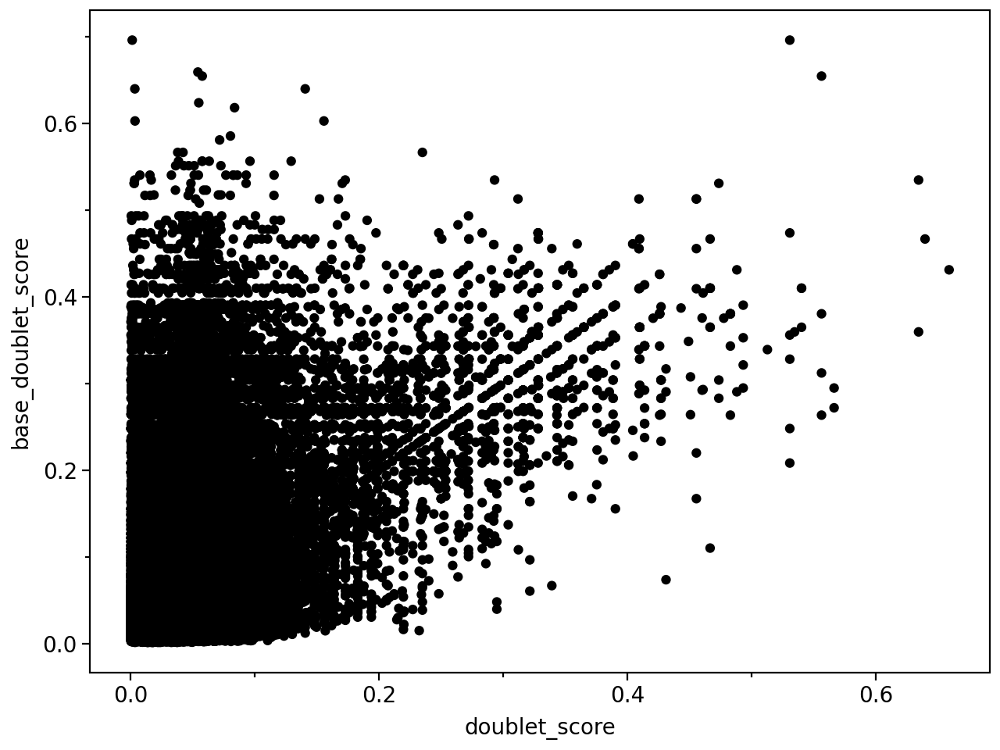

In [26]:
ggplot(adata.obs, aes(x="doublet_score", y="base_doublet_score")) + geom_point()

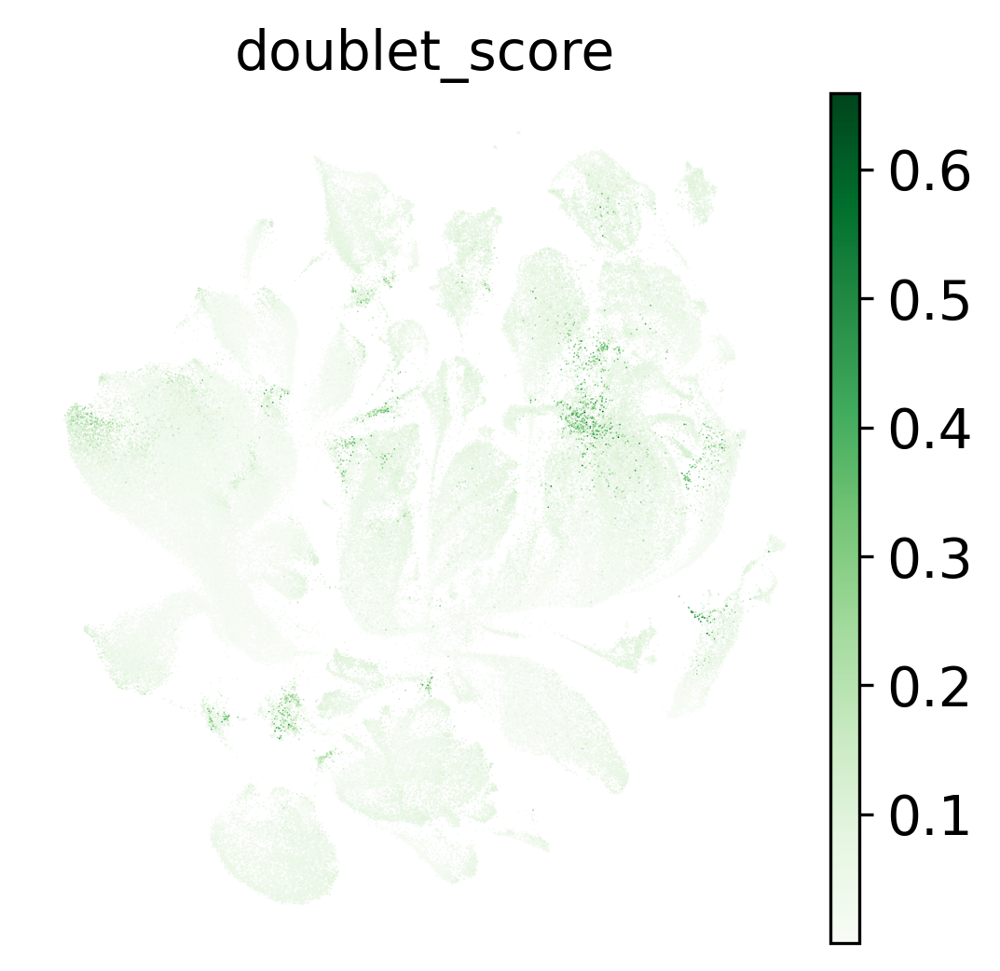

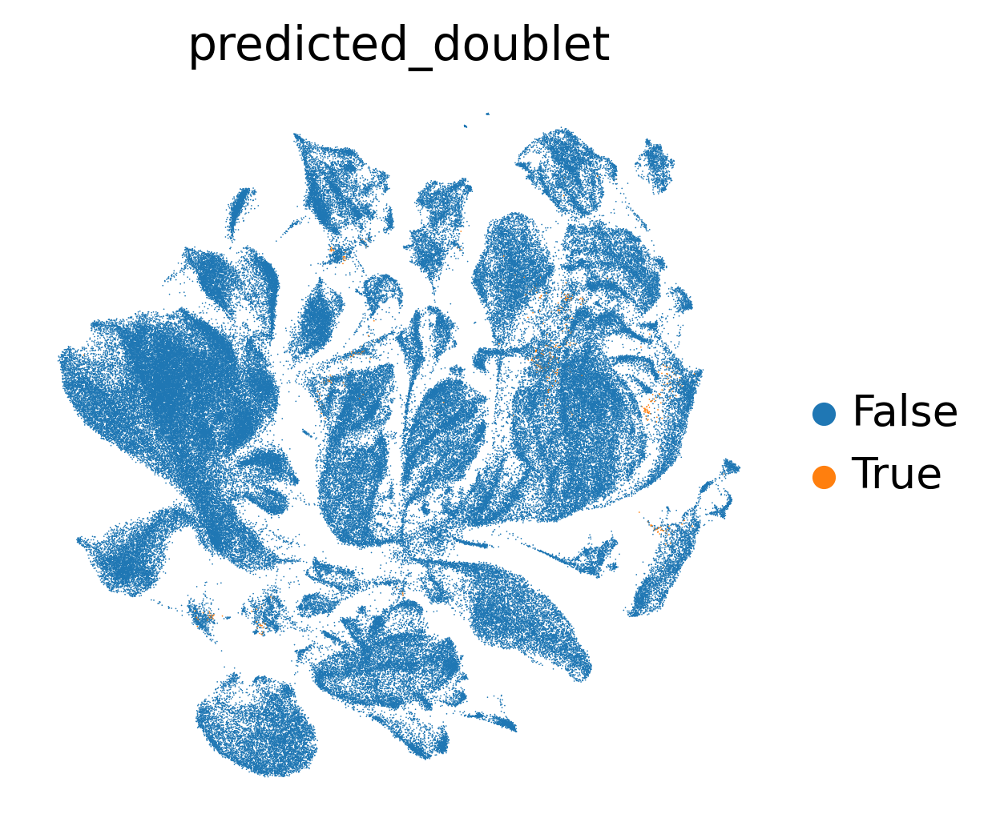

In [27]:
sc.pl.umap(adata, color="doublet_score", color_map="Greens")
sc.pl.umap(adata, color="predicted_doublet")

## 1.2 Filtering and Normalization

We clean the AnnData object for further analysis after the batch correction (section 1.2).
We use following cutoff QM:
- `max_pct_counts_mt`: The maximum percentage of mitochondrial RNA.
- `min_total_counts`: The minimum number of gene-mapped reads per cell.
- `min_n_genes`: The minimum number of genes detected per cell.

In [46]:
def threshold(adata, metric: list[str], dir: list[int], nmads: int):
    for i, m in enumerate(metric):
        M = adata.obs[m]
        if dir[i] == 0:
            thr = np.median(M) - nmads * np.median(np.abs(M - np.median(M)))
            thr = np.exp(thr) - 1
        else:
            thr = np.median(M) + nmads * np.median(np.abs(M - np.median(M)))
        print(f"Threshold for {m} is {thr}")


threshold(adata, ["log1p_total_counts", "log1p_n_genes_by_counts"], [0, 0], nmads=5)
threshold(adata, ["pct_counts_mt"], [1], nmads=5)


Threshold for log1p_total_counts is 82.48376099699229
Threshold for log1p_n_genes_by_counts is 117.08463848515211
Threshold for pct_counts_mt is 3.4462822246601488


In [47]:
def filter_anndata_by_qc(adata, max_pct_counts_mt, min_total_counts, min_n_genes) -> anndata.AnnData:
    """
    Filter the AnnData object based on quality control (QC) metrics to remove low-quality cells.

    Parameters:
    -----------
    adata : anndata.AnnData
        The input AnnData object containing single-cell RNA-seq data, including QC metrics such as
        percent mitochondrial RNA, total counts, and number of genes detected.

    max_pct_counts_mt : float, optional (default=100.0)
        The maximum percentage of mitochondrial RNA allowed for a cell to be kept. A high percentage
        of mitochondrial reads can indicate low-quality cells, as these cells might be dying or damaged.

    min_total_counts : int, optional (default=0)
        The minimum number of total gene-mapped reads required for a cell to be kept. Cells with low
        total counts may have insufficient sequencing depth, leading to poor identification of cell types.

    min_n_genes : int, optional (default=0)
        The minimum number of detected genes per cell. Cells with low numbers of detected genes may
        also indicate poor quality or insufficient sequencing depth.

    Returns:
    --------
    filtered_adata : anndata.AnnData
        A filtered AnnData object with low-quality cells removed based on the specified thresholds.
        The filtered data is saved to a new file and reloaded in backed mode for further analysis.

    Notes:
    ------
    - The function filters out predicted doublets (cells suspected of being doublets) as well.
    - A high percentage of mitochondrial reads may indicate low-quality or dying cells.
    - A low number of total counts or genes per cell may suggest low sequencing depth, resulting
      in inaccurate cell type identification.
    - After filtering, the cleaned data is saved to an H5AD file with gzip compression and reloaded.
    """
    adata = adata[~adata.obs["base_predicted_doublet"] & (adata.obs["pct_counts_mt"] <= max_pct_counts_mt) &
                  (adata.obs["total_counts"] >= min_total_counts) &
                  (adata.obs["n_genes_by_counts"] >= min_n_genes), :]

    adata.write_h5ad("MFC_RNA_QC.h5ad", compression="gzip")

    return anndata.read_h5ad("MFC_RNA_QC.h5ad", backed="r")

# Decide on parameters then run the function below so that we have an updated adata in memory
adata = filter_anndata_by_qc(adata, max_pct_counts_mt=5, min_total_counts=82, min_n_genes=117)

## 1.3 Batch correction

Batch correction is a technique used to correct for unwanted technical variation that arises when experiments are processed in separate batches. In single-cell RNA sequencing (scRNA-seq) and other biological experiments, samples are often processed in different conditions, machines, or times, leading to differences (biases) in the data that are not due to biological factors.

Batch effects can make it appear as though cells from different batches are different from each other, even when they are biologically similar. This can distort the results of analyses like clustering or gene expression comparisons, leading to incorrect conclusions.

Batch correction aims to remove these technical differences while preserving the true biological variability between cells. It helps to align cells from different batches so that cells with similar biological characteristics cluster together, regardless of which batch they came from.

For example, in scRNA-seq, cells from different patient samples or different experimental days might have batch-specific biases. Batch correction ensures that cells are clustered by their true biological properties rather than technical artifacts.

**Batch correction is always done after PCA.** PCA allows to get low-dimentiality representations. Then we can run batch adjustment either with Harmony or Sanoma algorithms. Harmony is build on top of K-Means, Sanoma on top of Nearest Neighbors.

**Here we will use K-Means and Harmony for Batch Correction**


[Harmony](https://www.nature.com/articles/s41592-019-0619-0) is one of the most cited and [best performing](https://www.nature.com/articles/s41592-021-01336-8/figures/2) for this task, employing a K Means based clustering across datasets and updating across iterations

In [65]:
def kmeans_plus_plus(X: np.ndarray, k: int) -> np.ndarray:
    """
    Initialize cluster centroids using the k-means++ algorithm.

    Parameters:
    -----------
    X : np.ndarray
        The data matrix of shape (n_samples, n_features) where each row represents a data point.

    k : int
        The number of clusters (centroids) to initialize.

    Returns:
    --------
    centroids : np.ndarray
        An array of shape (k, n_features) representing the initial cluster centroids
        chosen by the k-means++ algorithm.
    """
    n_samples, n_features = X.shape
    centroids = np.zeros((k, n_features))
    # Randomly choose the first centroid
    first_centroids = X[np.random.randint(n_samples)]
    for i in range(1, k):
        # Compute distances from the current centroids
        if i == 1:
            distances = np.linalg.norm(X - first_centroids, axis=1)
        else:
            distances = np.min(np.linalg.norm(X[:, np.newaxis] - centroids[:i], axis=2), axis=1)

        # Choose the next centroid with probability proportional to the squared distance
        probabilities = distances ** 2
        probabilities /= probabilities.sum()
        next_centroid_index = np.random.choice(n_samples, p=probabilities)
        centroids[i] = X[next_centroid_index]
    return centroids

def assign_clusters(X: np.ndarray, centroids: np.ndarray) -> np.ndarray:
    """
    Assign each data point in X to the nearest centroid.

    Parameters:
    -----------
    X : np.ndarray
        The data matrix of shape (n_samples, n_features).

    centroids : np.ndarray
        The matrix of shape (k, n_features) containing the centroids.

    Returns:
    --------
    labels : np.ndarray
        A 1D array of shape (n_samples,) where each element represents the index of the nearest centroid for a data point.
    """
    labels = np.argmin(np.linalg.norm(X[:, np.newaxis] - centroids, axis=2), axis=1)
    return labels
    

def compute_centroids(X: np.ndarray, labels: np.ndarray, k: int) -> np.ndarray:
    """
    Recompute centroids by averaging the points assigned to each cluster.

    Parameters:
    -----------
    X : np.ndarray
        The data matrix of shape (n_samples, n_features).

    labels : np.ndarray
        A 1D array of shape (n_samples,) containing the cluster label for each data point.

    k : int
        The number of clusters.

    Returns:
    --------
    centroids : np.ndarray
        A matrix of shape (k, n_features) representing the new centroids after re-calculating the mean of points in each cluster.
    """
    centroids = np.zeros((k, X.shape[1]))
    for i in range(k):
        cluster_points = X[labels == i]
        if cluster_points.size > 0:
            centroids[i] = np.mean(cluster_points, axis=0)
        else:
            # If no points are assigned to this centroid, keep the previous centroid
            centroids[i] = np.nan
    return centroids

def kmeans(data: np.ndarray, num_clusters: int, n_init: int = 10) -> np.ndarray:
    """
    Run the K-Means algorithm to find cluster centroids.

    Parameters:
    -----------
    data : np.ndarray
        The data matrix of shape (n_samples, n_features).

    num_clusters : int
        The number of clusters (k) to create.

    n_init : int, optional (default=10)
        The number of times to run the K-Means algorithm with different centroid seeds. The best clustering is selected.

    Returns:
    --------
    centroids : np.ndarray
        A matrix of shape (num_clusters, n_features) representing the final centroids of the clusters.
    """
    def run_single_kmeans(data: np.ndarray, num_clusters: int) -> np.ndarray:
        centroids = kmeans_plus_plus(data, num_clusters)
        # Iterate until convergence or a maximum number of iterations
        for _ in range(25):  # Arbitrary number of iterations
            new_labels = assign_clusters(data, centroids)
            new_centroids = compute_centroids(data, new_labels, num_clusters)
            if np.allclose(centroids, new_centroids, atol=1e-4):
                break
            centroids = new_centroids
        inertia = np.sum(np.min(np.linalg.norm(data[:, np.newaxis] - centroids, axis=2), axis=1))
        return centroids, inertia
    
    best_inertia = None
    best_centroids = None
    for i in range(n_init):
        test_centroids, inertia = run_single_kmeans(data, num_clusters)
        if best_inertia is None or inertia < best_inertia:
            best_centroids = test_centroids
            best_inertia = inertia

        # I = np.random.choice(np.arange(data.shape[0]), num_clusters)
        # clust = data[I, :]
        ### Add iterative logic for updating clusters
    return best_centroids

# This line will use the K-Means function during the batch correction process using Harmony.
sc.external.pp.harmony_integrate(adata, key="library_id", cluster_fn=kmeans)

2025-07-07 23:00:45,183 - harmonypy - INFO - Iteration 1 of 10
2025-07-07 23:01:30,466 - harmonypy - INFO - Iteration 2 of 10
2025-07-07 23:02:12,512 - harmonypy - INFO - Iteration 3 of 10
2025-07-07 23:02:54,521 - harmonypy - INFO - Iteration 4 of 10
2025-07-07 23:03:35,143 - harmonypy - INFO - Iteration 5 of 10
2025-07-07 23:04:19,206 - harmonypy - INFO - Iteration 6 of 10
2025-07-07 23:05:02,808 - harmonypy - INFO - Iteration 7 of 10
2025-07-07 23:05:44,189 - harmonypy - INFO - Converged after 7 iterations


In [64]:
X = adata.obsm["X_pca"].astype(np.float64)
kmeans(X, num_clusters=4, n_init=2)

array([[-2.24069698e+01,  7.17732750e+00,  2.70454780e+00,
         4.95442588e-01, -3.65324522e-01, -4.86121443e-01,
        -1.72883891e-01,  5.30189312e-02, -1.60225631e-01,
         4.40862435e-02, -7.84705185e-02, -1.46349590e-01,
         6.27398390e-02,  6.21124269e-05, -8.41547334e-02,
        -6.64889529e-03,  2.13233946e-02, -2.82619648e-02,
        -8.04674834e-02, -1.79168716e-02,  1.39190423e-02,
        -1.31859115e-02, -7.92841358e-03, -5.96239460e-03,
        -6.33297392e-03, -1.10228167e-01,  2.73672115e-02,
         4.94732448e-03, -1.51446126e-02,  3.60555917e-03,
        -4.42911180e-03, -1.44823586e-03,  4.38634676e-03,
        -1.83739868e-02, -3.16805833e-02, -3.04983656e-03,
        -3.10809392e-02,  1.85590946e-02, -1.79630714e-02,
         1.07485040e-02,  2.86856355e-03,  5.64862741e-03,
         3.43170064e-02, -7.43115131e-03, -2.38883305e-02,
        -3.97282146e-02,  1.09033980e-02,  2.08774599e-02,
        -2.49842968e-02,  1.49800847e-02],
       [-5.98

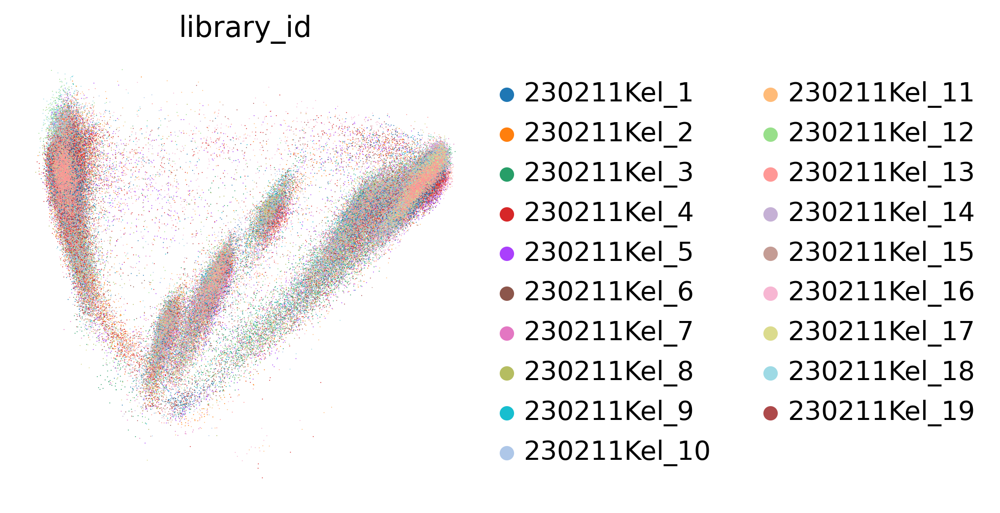

In [67]:
sc.pl.embedding(adata, basis="X_pca_harmony", color="library_id")

## 1.4 Cell Type Annotation

For annotation the following workflow is used: 
- use Leiden algorithm for clustering (we can use different resolution parameters here)
- use umap with Nearest Neighbors for vizualization


Graph clustering is generally used to obtain cell types. From the clustering obtained, we rename each of the cell types into the column `CellType` with the following gene markers:


    SYT1, SLC17A7: Excitatory neuron ("Exc")
    SYT1, GAD1, GAD2: Inhibitory neuron ("Inh")
    AIF1, P2RY12, CSF1R: Microglia ("Mic")
    MBP, MOBP, PLP1: Oligodendrocyte ("Oli")
    PDGFRA, VCAN: Oligodendrocyte precursor cell ("Opc")
    GFAP, AQP4, S100B: Astrocyte ("Ast")
    FLT1, CLDN5, PDGFRB, DLC1, CEMIP: Vascular cell ("Vas")


In [69]:
def cluster_data(adata:anndata.AnnData) -> anndata.AnnData:
    """Cluster the data and compute a UMAP embedding"""
    sc.pp.neighbors(adata, use_rep="X_pca_harmony") ### Use Harmony for KNN graph
    sc.tl.leiden(adata)
    sc.tl.umap(adata)
    adata.write_h5ad("RNA_Harmony.h5ad", compression="gzip")
    adata = anndata.read_h5ad("RNA_Harmony.h5ad", backed="r")
    return adata

adata = cluster_data(adata)

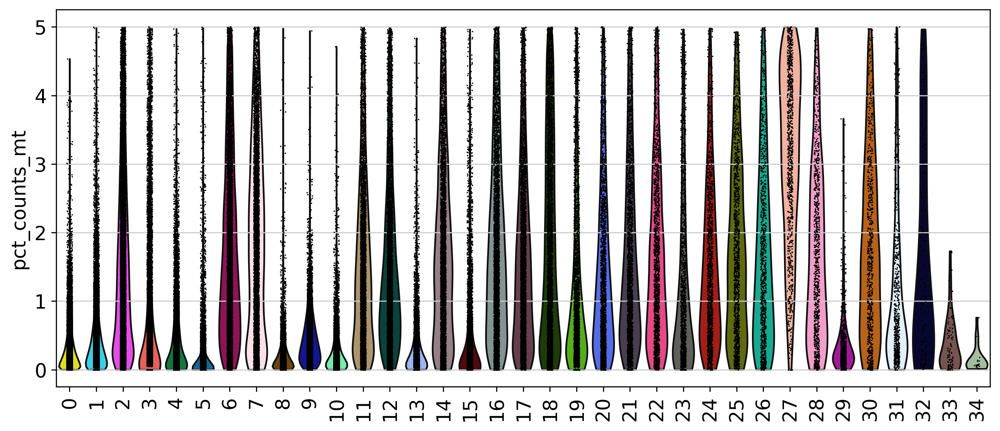

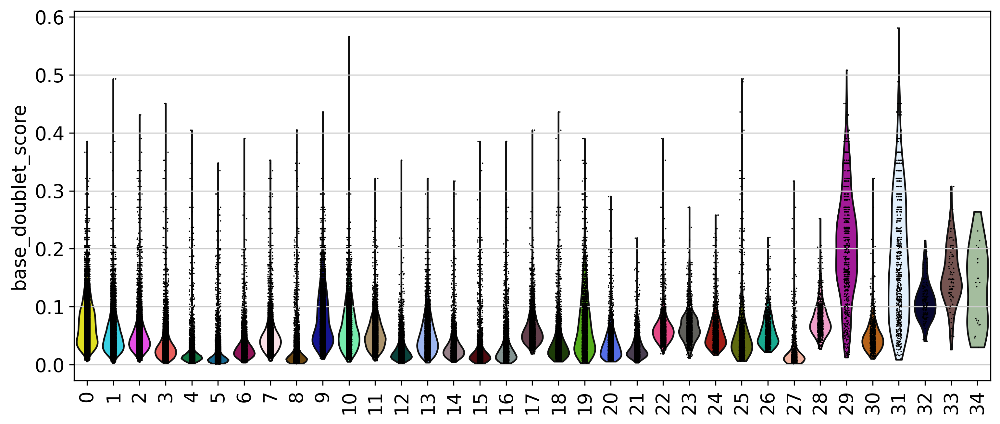

In [74]:
def plot_qc(adata:anndata.AnnData, groupby:str="leiden"):
  """For some clustering, plot distributions of %MT and % doublet score.
   Percent mitochondrial if dominating a cluster's signature can indicate poor sequencing quality.
   Additionally, if a cluster has a strong enrichment of doublet like cells, it may be an un-called doublet.
   """
  with rc_context({"figure.figsize": (10, 5)}):
    sc.pl.violin(adata, groupby=groupby, keys=["pct_counts_mt"], rotation=90)
    sc.pl.violin(adata, groupby=groupby, keys=["base_doublet_score"], rotation=90)

plot_qc(adata)

In [407]:
### What are the gene expression profiles?
def plot_markers(adata:anndata.AnnData,
                 groupby="leiden",
                 markers:List[str]=["SYT1", "SLC17A7", "GAD1", "GAD2", "MBP", "MOBP", "PLP1", "VCAN", "PDGFRA", "AQP4", "GFAP", "S100B", "CSF1R", "P2RY12", "AIF1", "FLT1", "CLDN5", "PDGFRB", "DLC1", "CEMIP"]) -> anndata.AnnData:
    """Load in a tiny object containing only the genes of interest, but normalize to the full data size, and plot a dotplot."""
    pdata = adata[:, markers].to_memory()
    pdata.X = np.log1p(diags(10000. / pdata.obs["total_counts"].values).dot(pdata.X))
    sc.pl.dotplot(pdata, groupby=groupby, var_names=markers)
    return pdata

# plot_markers(adata, groupby="leiden")

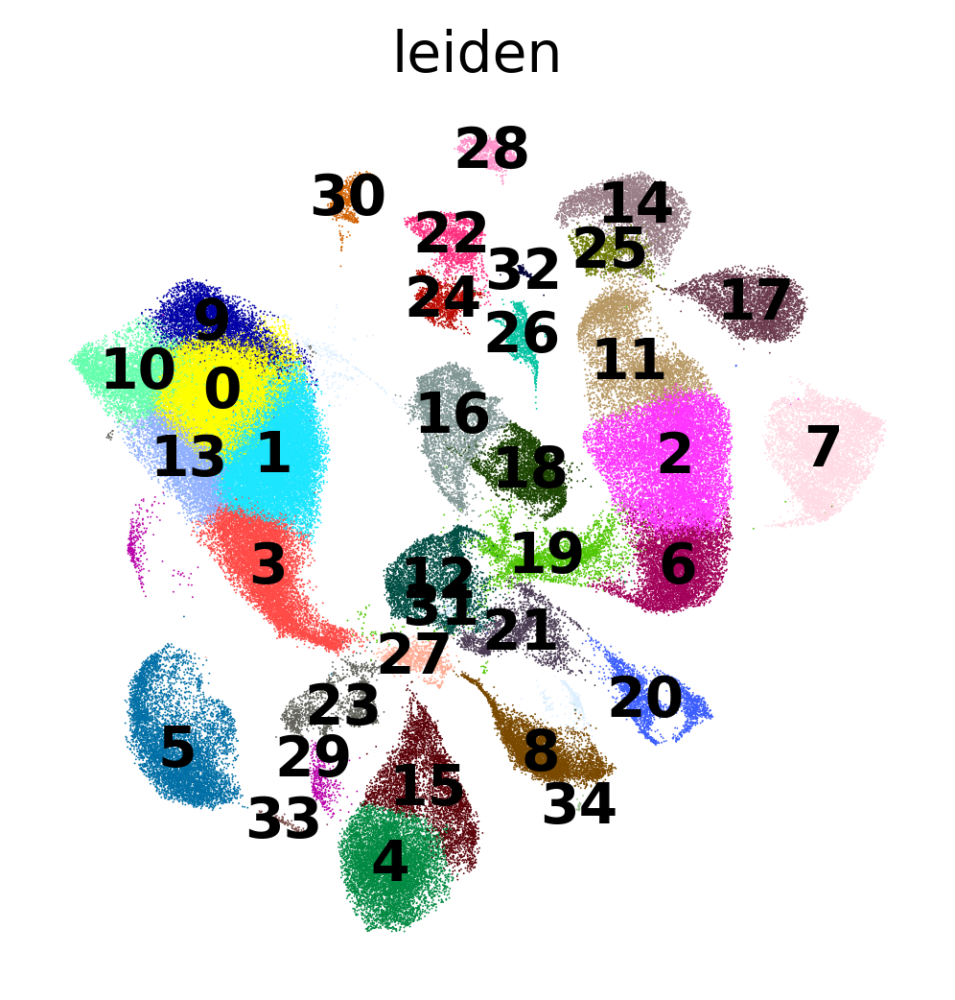

In [75]:
sc.pl.umap(adata, color="leiden", legend_loc="on data")

In [10]:
celltype_table = {
    "Excitatory neuron ('Exc')": ["2", "7", "11", "14", "17", "28", "32"],
    "Inhibitory neuron ('Inh')": ["12", "16", "20", "21"],
    "Microglia ('Mic')": ["5"],
    "Oligodendrocyte ('Oli')": ["0", "1", "9", "10", "13","31"],
    "Oligodendrocyte precursor cell ('Opc')": ["8", "34"],
    "Astrocyte ('Ast')": ["4", "15"],
    "Vascular cell ('Vas')": ["23"]
}
#     SYT1, SLC17A7: Excitatory neuron ("Exc")
#     SYT1, GAD1, GAD2: Inhibitory neuron ("Inh")
#     AIF1, P2RY12, CSF1R: Microglia ("Mic")
#     MBP, MOBP, PLP1: Oligodendrocyte ("Oli")
#     PDGFRA, VCAN: Oligodendrocyte precursor cell ("Opc")
#     GFAP, AQP4, S100B: Astrocyte ("Ast")
#     FLT1, CLDN5, PDGFRB, DLC1, CEMIP: Vascular cell ("Vas")

In [ ]:
def assign_celltypes(adata:anndata.AnnData, **celltype_table) -> anndata.AnnData:
  """Takes a input dict of cell type names to a list of strings, assigns clusters in that list to the key.
  Based on markers in the previous ipynb cell, assign cell types to each cluster."""
  adata.obs["CellType"] = "Unassigned"
  for ct, leiden in celltype_table.items():
    adata.obs.loc[adata.obs["leiden"].isin(leiden), "CellType"] = ct
  return adata

adata = assign_celltypes(adata, **celltype_table)
plot_markers(adata, groupby="CellType")
adata.write_h5ad("RNA_Annotated.h5ad", compression='gzip')

In [13]:
adata.obs["CellType"].value_counts()

CellType
Oligodendrocyte ('Oli')                   53053
Excitatory neuron ('Exc')                 31692
Unassigned                                30335
Inhibitory neuron ('Inh')                 12970
Astrocyte ('Ast')                         12373
Microglia ('Mic')                          7266
Oligodendrocyte precursor cell ('Opc')     5609
Vascular cell ('Vas')                      1535
Name: count, dtype: int64

In [ ]:
### Save and reload only annotated cells if you want, but not really necessary.
if False: ### re-plot UMAP if you want pretty plots
  adata = adata[adata.obs["CellType"] != "Unknown", :]
  adata.write_h5ad("RNA_Annotated.h5ad", compression='gzip')
  adata = anndata.read_h5ad("RNA_Annotated.h5ad", backed="r")
  sc.pp.neighbors(adata, use_rep="X_pca_harmony")
  sc.tl.umap(adata)

In [2]:
adata = anndata.read_h5ad("RNA_Annotated.h5ad", backed="r")

In [63]:
import matplotlib.pyplot as plt

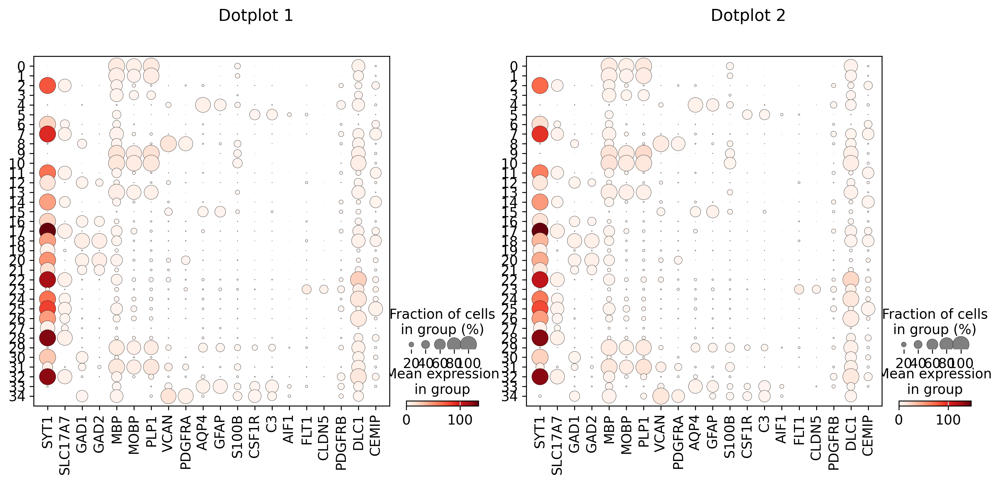

In [ ]:
genes_show = ["SYT1", "SLC17A7", "GAD1", "GAD2", "MBP", "MOBP", "PLP1", "VCAN", "PDGFRA", "AQP4", "GFAP", "S100B", "CSF1R", 
              "C3", "AIF1", "FLT1", "CLDN5", "PDGFRB", "DLC1", "CEMIP"]
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# First dotplot
sc.pl.dotplot(
    adata[adata.obs["Pathologic_diagnosis_of_AD"] == 'yes'],
    var_names=genes_show,
    groupby="leiden",
    ax=axes[0],
    show=False
)
axes[0].set_title("Dotplot 1")

# Second dotplot
sc.pl.dotplot(
    adata[adata.obs["Pathologic_diagnosis_of_AD"] == 'no'],
    var_names=genes_show,
    groupby="leiden",
    ax=axes[1],
    show=False
)
axes[1].set_title("Dotplot 2")

# Adjust layout and show the plots
plt.tight_layout()
plt.show()
# 

**Results:**
1. Sample heterogenety has huge impact on annotation. I believe there is some biological effect in different gene expresion within one cell type. Howevere such huge generogenity in genes content like presence SYT1 in every cluster may signify thenical effect. Probably more experimentation with clustering procedure requiered. 

2. Spliting the dataset by level of diagnises doen't seem to effect the annotation, the only minor changes are present.

3. While number of clusters seems to be a random number, the annotation after assigning clusters to cell's groups suppose that the smallest group of cells are vascular. The biggest group of cell is glia with the highest content of Oligodendrocytes.

4. I would not change PCA and Harmony, since they are responsive to neighbor map and don't effect clustering. I would probably try different resolutions for Leiden clustering method to check other spliting strategies.

# **2. Differential Expression Analysis**

**Bulk RNA-seq, Psuedobulk, and scRNA-seq**

Pseudo-bulk RNA sequencing is a technique used in the analysis of single-cell RNA sequencing (scRNA-seq) data, offering a bridge between single-cell resolution and traditional bulk RNA-seq methods.

**Bulk RNA-seq**
Bulk RNA sequencing aggregates RNA from a collection of cells, typically millions, into a single sample for sequencing. This provides a general overview of gene expression across all cells in the sample but lacks the resolution to discern differences among individual cell types or states within the sample. It's highly effective for analyzing overall gene expression in tissues or cultures where the average expression level is the main focus.

In contrast, single-cell RNA (scRNA-seq) sequencing involves isolating and sequencing the RNA from individual cells. This method provides a high-resolution view of gene expression variations across individual cells within a heterogeneous population. It's particularly useful for understanding complex tissues with multiple cell types, identifying novel cell types, or studying cellular responses at an individual level.

**Why Pseudo-Bulk?**
While scRNA-seq offers high granularity, certain analyses like differential gene expression can lead to erroneous results since cells from the same sample are very well correlated, much more than to other smaples, which may lead to inflated p-values. Pseudo-bulk analysis mitigates this by aggregating single-cell data from the same cell type or condition into "pseudo-samples." This aggregation:

- Increases statistical power: By summing counts across cells, it ensures the statisitics are well calibrated, avoiding inflated Type 1 error from a more naive approach.
- Maintains cell-type specificity: By aggregating only cells of the same type or from the same condition, it retains crucial biological distinctions that are averaged out in traditional bulk RNA-seq.
- Many well-developed statistical tools for differential expression in bulk RNA-seq can then be applied to these pseudo-bulk datasets, leveraging their robustness and maturity.

Thus, pseudo-bulk analysis provides a practical compromise, harnessing the cell-specific insights of scRNA-seq while utilizing the robust statistical frameworks developed for bulk RNA-seq.

**Psuedobulk and Alzheimer's**

To understand cell type-specific changes, it is important to identify differentially expressed genes (DEGs) between conditions (e.g., Alzheimer's status). Pseudobulk methods are great for many of these when metadata is rich and the sample size is large, as they are well suited for subject-level covariate adjustments; additionally, the runtime of fancier models like GLMM will take much longer to compute and can suffer more from misspecification.

In this section, we will create a pseudo-bulk dataset and explore how factors such as covariates and normalization methods impact the analysis of differentially expressed genes.


### 2.1: Creation and Analysis of Pseudo-Bulk scRNA-seq Data

To demonstrate the pseudo-bulk scRNA-seq analysis, we'll focus on the microglia cells only:

1. Filter the AnnData object to retain only microglia cells.
2. For each sample (using the `library_id` in adata.obs), sum the raw counts (not the normalized counts) across all microglia cells to create a new pseudo-bulk AnnData object. This means aggregating the adata.X matrix for all cells within each sample. The resulting pseudo-bulk AnnData object should have one row per sample, where the values (`.X`)represent the total integer counts per gene across all microglia cells from that sample.

3. Calculate the library size for each sample in the pseudo-bulk object (i.e., the total number of counts per sample), and visualize, grouped by Alzheimer's disease status to distinguish between AD and control samples.


In [244]:
def pseudobulk(adata: anndata.AnnData, groupby: str) -> anndata.AnnData:
    """
    Aggregate raw counts from single-cell data to create a pseudo-bulk AnnData object.

    Parameters:
    -----------
    adata : anndata.AnnData
        The input single-cell RNA-seq data.

    groupby : str
        Column in `adata.obs` used for grouping cells to aggregate.

    Returns:
    --------
    pseudobulk_adata : anndata.AnnData
        A new AnnData object with rows as groups and columns as genes, with summed gene expression counts per group.

    Notes:
    ------
    - Ensure raw counts from `adata.X` are used.
    - Handle large datasets by loading data in batches if necessary.
    """
    if adata.isbacked: ### If using on-disk format, load into memory now.
        adata = adata.to_memory()

    from scipy import sparse

    groupby_object = adata.obs.groupby([groupby], observed = True)
    obs_names = groupby_object.nunique().max(axis=0) == 1
    obs_names_inv = obs_names[obs_names].index.tolist()
    
    X = adata.X

    N_obs = groupby_object.ngroups
    N_var = X.shape[1]
    X_summed = sparse.lil_matrix((N_obs, N_var))

    group_names = []
    # index_names = []
    row = 0
    for group_columns, idx_ in groupby_object.indices.items():
        X_summed[row] = X[idx_].sum(axis=0)
        row += 1
        group_names.append(group_columns)
        # index_names.append('_'.join(map(str, group_columns)))

    if sparse.isspmatrix_csr(X):
        X_summed = X_summed.tocsr()
    else:
        X_summed = np.array(X_summed.todense())
    
    obs = groupby_object[obs_names_inv].first()

    pseudobulk_adata = anndata.AnnData(X = X_summed, obs = obs, var = adata.var)

    # sc.get.aggregate(adata, by=["sample", "CellType"], func="sum", layer="counts")

    return pseudobulk_adata
    
    

ps_mic = pseudobulk(adata[adata.obs["CellType"] == "Microglia ('Mic')", :].to_memory(), groupby="library_id")
sc.pp.filter_genes(ps_mic, min_counts=100)
sc.pp.calculate_qc_metrics(ps_mic, inplace=True)

In [245]:
ps_mic

AnnData object with n_obs × n_vars = 19 × 9797
    obs: 'subject', 'msex', 'age_death', 'pmi', 'race', 'Pathologic_diagnosis_of_AD', 'predicted_doublet', 'base_predicted_doublet', 'leiden', 'CellType', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'gene_length', 'strand', 'interval', 'chrX', 'chrY', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std', 'n_counts'

### 2.2 Differential Expression Analysis

Major promlem is we only have 19 samples with over 10k genes. While we still can make a differential exponential analysis (DEA), it won't be correct, since most of statistical analysises require 20+ points. 

Here we provide what approaches for DEA can be taken from current point:
1. Log-transformation (transition from counts and contineous values), normalization and PCA on aggregated data
2. t-test: can be calculated with `sc.get.rank_genes_groups_df()`. Takes a student's t-test to compare the expression of gene in the sample over the rest samples. Can be performed for every separate gene. As a result we get p-value for every gene for every sample. Then we can adjust p-value to account for multiple hypothesis testing (Benjamini-Hochberg procedure). Analysis also can be done as a A/B testing by comparing testing group over control.
3. Two plots that build from variables: `(logP + logC) / 2 - library size, log P/C = logfoldchange, where P - testing counts, C - control counts`. Plots provide information how coupled change in gene expression for different samples.
    * ML Plot, helping to spot trends and outliers in differential expression data: library size vs logfolchange
    * Volcano Plot allows to quickly identify genes with significant changes in expression due to their large fold changes and low p-values, which are potentially relevant for further biological investigation: logfoldchange vs -log(P-values adj)
4. Covariates analysis:

    When applying DESeq2 to analyze pseudo-bulked excitatory neurons from individuals with and without Alzheimer’s disease, considering covariates such as sex, age at death, post-mortem interval (PMI) is crucial. These factors can introduce variability in gene expression that is not directly related to disease status. For example, age at death might influence gene expression patterns independently of Alzheimer's pathology, and similarly, sex can influence the expression of X and Y chromosomal genes.

    Running the analysis without these covariates can provide a baseline understanding of the differences in gene expression between the groups.
    However, not including relevant covariates may be considered [omitted variable bias](https://en.wikipedia.org/wiki/Omitted-variable_bias), which can misattribute changes to this un-included covariates. Therefore, including these covariates helps to refine this analysis by accounting for these additional sources of variation, thereby isolating the effect of the disease condition more precisely. This allows us to draw a stronger link between gene expression and disease status.

    Can be done with PyDESeq2. Code is included to run two different configuration: 
    - no covariates
    - sex, age_death, PMI as covariates

In [ ]:
def run_ttest(adata:anndata.AnnData, groupby="Pathologic_diagnosis_of_AD") -> pd.DataFrame:
  """Make sure you log normalize the AnnData object (preferably a copy to not destroy the adata object's integer counts),
  and then run sc.tl.rank_genes_groups using a t-test. See documentation for this function
  at https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html
  Make sure you also add the log1p total counts per gene as well (un normalized)"""
  tdata = adata.copy()
  sc.tl.rank_genes_groups(tdata, groupby=groupby, method="t-test")
  df = sc.get.rank_genes_groups_df(tdata, group="yes")
  df_comb = df.set_index("names") ### Set the index to the gene names, but keep the names column
  df_comb.loc[:, "log1p_total_counts"] = tdata.var["log1p_total_counts"]
  ### Add number of total transcripts for each gene as well (integer)
  return df_comb.reset_index()

def volcano(df:pd.DataFrame, gene_col="gene", log2FC_col="logfoldchanges", padj_col="pvals"):
  """Plot a volcano plot of a dataframe, taking in custom column names. This is to ensure
  that this function works for both t-test as well as pyDESeq2 in 2.4.
  You can use plotting libraries like plotnine (ggplot, etc), matplotlib, or seaborn for this."""
  import seaborn as sns
  plt.figure(figsize=(4, 4))
  sns.scatterplot(
        x=log2FC_col,
        y=-np.log10(df[padj_col]),
        hue=gene_col,
        data=df,
        alpha=0.7,
        legend=False
    )

  # Add threshold lines
  plt.axvline(x=2, color='gray', linestyle='--', label="log2FC = 2")
  plt.axvline(x=-2, color='gray', linestyle='--', label="log2FC = -2")
  
  # Add labels and title
  plt.xlabel("Log2 Fold Change")
  plt.ylabel("-Log10 Adjusted P-value")
  plt.title("Volcano Plot")
  plt.legend()

def maplot(df:pd.DataFrame, gene_col="gene", log2FC_col="logfoldchanges", library_size_col="log1p_total_counts"):
  """Plot an MA plot of a dataframe, taking in custom column names. This is to ensure
  that this function works for both t-test as well as pyDESeq2 in 2.4.
  You can use plotting libraries like plotnine (ggplot, etc), matplotlib, or seaborn for this."""
  plt.figure(figsize=(4, 4))
  plt.scatter(df[library_size_col]/2, df[log2FC_col], c='blue', alpha=0.5)
  plt.xlabel("Average Expression (Log2)")
  plt.ylabel("Log2 Fold Change")
  plt.title("MA-Plot")
  plt.legend()

In [259]:
def run_deseq2(adata, groupby:str, covariates:List[str]=[], n_cpus:int=4):
    """From the pseudo-bulk AnnData object, run DESeq2 on a categorical group with optional covariates.
    A step by step tutorial is provided at https://pydeseq2.readthedocs.io/en/latest/auto_examples/plot_step_by_step.html#sphx-glr-auto-examples-plot-step-by-step-py"""
    if adata.isbacked: ### If using on-disk format, load into memory now.
        adata = adata.to_memory() 
    if "counts" not in adata.layers:
        adata.layers["counts"] = adata.X.copy()
    pdata = adata.copy()
    counts = pdata.layers["counts"].copy() ### Use the raw counts layer
    if isspmatrix_csr(counts):
        counts = counts.toarray()
    pdata.X = counts
    inference = DefaultInference(n_cpus=n_cpus)
    design_params = [groupby] + covariates
    dds = DeseqDataSet(adata=pdata,
                       design="~" + " + ".join(design_params),
                       inference=inference)
    dds.deseq2()
    result = DeseqStats(dds, contrast=[groupby, "yes", "no"], inference=inference) ### Fill in with correct parameters
    result.summary()
    return result

In [ ]:
without_cov = run_deseq2(ps_mic, "Pathologic_diagnosis_of_AD", [], n_cpus=1)
with_cov = run_deseq2(ps_mic, "Pathologic_diagnosis_of_AD", ['msex', 'age_death', 'pmi'], n_cpus=1)

Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 7.81 seconds.

Fitting dispersion trend curve...
... done in 0.31 seconds.

Fitting MAP dispersions...
... done in 8.61 seconds.

Fitting LFCs...
... done in 4.53 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 79 outlier genes.

Fitting dispersions...
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.07 seconds.

Fitting LFCs...
... done in 0.04 seconds.

Running Wald tests...
... done in 1.06 seconds.

Fitting size factors...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: Pathologic_diagnosis_of_AD yes vs no
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AL627309.1    5.346491       -0.077300  0.512268 -0.150898  0.880056  0.999372
AL627309.5    9.660383       -0.561179  0.371600 -1.510169  0.131000  0.999372
LINC01409    16.427701       -0.245589  0.278519 -0.881766  0.377903  0.999372
LINC01128    12.321371        0.220607  0.390978  0.564245  0.572588  0.999372
NOC2L         7.729097        0.495854  0.381588  1.299449  0.193790  0.999372
...                ...             ...       ...       ...       ...       ...
MT-ND4      183.991543        0.092907  0.695415  0.133600  0.893719  0.999372
MT-ND5       56.340285        0.415412  0.589415  0.704787  0.480943  0.999372
MT-CYB      122.882431        0.044897  0.512289  0.087639  0.930163  0.999372
AL354822.1    5.875660        1.225558  0.413349  2.964944  0.003027  0.999372
AL592183.1   38.973472        0.073486  0.477962  0.1537

Fitting dispersions...
... done in 7.87 seconds.

Fitting dispersion trend curve...
... done in 0.31 seconds.

Fitting MAP dispersions...
... done in 8.31 seconds.

Fitting LFCs...
... done in 7.79 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


Log2 fold change & Wald test p-value: Pathologic_diagnosis_of_AD yes vs no
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AL627309.1    5.346491        0.099631  0.827990  0.120328  0.904223  0.999981
AL627309.5    9.660383       -0.444784  0.584808 -0.760564  0.446917  0.999981
LINC01409    16.427701       -0.155951  0.400963 -0.388940  0.697321  0.999981
LINC01128    12.321371       -0.680079  0.531610 -1.279283  0.200798  0.999981
NOC2L         7.729097        0.906482  0.628762  1.441694  0.149389  0.999981
...                ...             ...       ...       ...       ...       ...
MT-ND4      183.991543        0.244117  1.164902  0.209560  0.834011  0.999981
MT-ND5       56.340285        0.957783  0.902371  1.061407  0.288505  0.999981
MT-CYB      122.882431        0.489106  0.688188  0.710716  0.477260  0.999981
AL354822.1    5.875660        0.273786  0.624362  0.438506  0.661019  0.999981
AL592183.1   38.973472       -0.071546  0.723782 -0.0988

... done in 1.05 seconds.



5. [UpSet plot](https://en.wikipedia.org/wiki/UpSet_plot): We can analyse how underregulated and overregulated genes shared between functions. 
    UpSet requires data in following format: 
    - for every gene calculate combination to that function the change in expression is significant
    - group over all combinations to get counts how many times every combination is meet
    Result is the plot: upper plot - combinations counts, lower plot - functions vs combinations
    

In [258]:
import upsetplot

In [263]:
deg_out = {}
cell_types = [
    "Excitatory neuron ('Exc')",
    "Inhibitory neuron ('Inh')",
    "Microglia ('Mic')",
    "Oligodendrocyte ('Oli')",
    "Oligodendrocyte precursor cell ('Opc')",
    "Astrocyte ('Ast')",
    "Vascular cell ('Vas')"]
for ct in cell_types:
  ps = pseudobulk(adata[adata.obs["CellType"] == ct, :].to_memory(), groupby="library_id")
  sc.pp.filter_genes(ps, min_counts=100)
  deg_out[ct] = run_deseq2(ps, "Pathologic_diagnosis_of_AD", ['msex', 'age_death', 'pmi'])

Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.

0.01s - Debugger warning: It seems that frozen modules are being used, which may
0.00s - make the debugger miss breakpoints. Please pass -Xfrozen_modules=off
0.00s - to python to disable frozen modules.
0.00s - Note: Debugging will proceed. Set PYDEVD_DISABLE_FILE_VALIDATION=1 to disable this validation.
0.01s - Debugger warning: It seems that frozen modules are being used, which may
0.00s - make the debugger miss breakpoints. Please pass -Xfrozen_modules=off
0.00s - to python to disable frozen modules.
0.00s - Note: Debugging will proceed. Set PYDEVD_DISABLE_FILE_VALIDATION=1 to disable this validation.
0.01s - Debugger warning: It seems that frozen modules are being used, which may
0.00s - make the debugger miss breakpoints. Please pass -Xfrozen_modules=off
0.00s - to python to disable frozen modules.
0.00s - Note: Debugging will proceed. Set PYDEVD_DISABLE_FILE_VALIDATION=1 to disable this validation.
0.01s - Debugger warning: It se

Log2 fold change & Wald test p-value: Pathologic_diagnosis_of_AD yes vs no
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
AL627309.1    52.371101       -0.263951  0.309616 -0.852511  0.393931   
AL627309.5   125.466172       -0.469360  0.309154 -1.518207  0.128962   
LINC01409    824.846098       -0.380218  0.244639 -1.554202  0.120136   
LINC01128    655.602192       -0.020319  0.150369 -0.135125  0.892513   
LINC00115     26.446190       -0.037054  0.372858 -0.099378  0.920838   
...                 ...             ...       ...       ...       ...   
AL354822.1   129.004065       -0.269061  0.472595 -0.569327  0.569134   
AL592183.1  1647.369738       -0.291738  0.834278 -0.349690  0.726571   
AC240274.1    62.569274       -0.034081  0.392011 -0.086940  0.930719   
AC004556.3     7.079402        0.207566  1.066350  0.194651  0.845667   
AC007325.4    84.922782        0.581578  0.380928  1.526739  0.126826   

                padj  
AL627309.1  0.893896  
AL

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 3.38 seconds.

Fitting dispersion trend curve...
... done in 0.51 seconds.

Fitting MAP dispersions...
... done in 3.54 seconds.

Fitting LFCs...
... done in 3.29 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.88 seconds.



Log2 fold change & Wald test p-value: Pathologic_diagnosis_of_AD yes vs no
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AL627309.5   10.024160       -0.544769  0.430896 -1.264271  0.206133  0.902192
LINC01409    80.795230       -0.165514  0.195712 -0.845700  0.397720  0.936089
LINC01128    71.250215       -0.037007  0.211210 -0.175213  0.860912  0.987064
NOC2L        43.920069        0.327729  0.263092  1.245685  0.212880  0.902192
KLHL17        8.808339        1.153161  0.615406  1.873820  0.060955  0.811110
...                ...             ...       ...       ...       ...       ...
AC011043.1   12.123759       -0.018746  0.871832 -0.021502  0.982845  0.998785
AL354822.1   19.952516       -0.272551  0.567832 -0.479985  0.631238  0.970673
AL592183.1  292.824993       -0.254109  0.841755 -0.301880  0.762743  0.978962
AC240274.1   14.435789        0.030033  0.454025  0.066149  0.947259  0.996687
AC007325.4    6.506440       -0.258956  0.765680 -0.3382

Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.93 seconds.

Fitting dispersion trend curve...
... done in 0.31 seconds.

Fitting MAP dispersions...
... done in 2.09 seconds.

Fitting LFCs...
... done in 2.43 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.54 seconds.



Log2 fold change & Wald test p-value: Pathologic_diagnosis_of_AD yes vs no
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AL627309.1    5.346491        0.099631  0.827990  0.120328  0.904223  0.999981
AL627309.5    9.660383       -0.444784  0.584808 -0.760564  0.446917  0.999981
LINC01409    16.427701       -0.155951  0.400963 -0.388940  0.697321  0.999981
LINC01128    12.321371       -0.680079  0.531610 -1.279283  0.200798  0.999981
NOC2L         7.729097        0.906482  0.628762  1.441694  0.149389  0.999981
...                ...             ...       ...       ...       ...       ...
MT-ND4      183.991543        0.244117  1.164902  0.209560  0.834011  0.999981
MT-ND5       56.340285        0.957783  0.902371  1.061407  0.288505  0.999981
MT-CYB      122.882431        0.489106  0.688188  0.710716  0.477260  0.999981
AL354822.1    5.875660        0.273786  0.624362  0.438506  0.661019  0.999981
AL592183.1   38.973472       -0.071546  0.723782 -0.0988

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 3.37 seconds.

Fitting dispersion trend curve...
... done in 0.52 seconds.

Fitting MAP dispersions...
... done in 3.97 seconds.

Fitting LFCs...
... done in 3.94 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.94 seconds.



Log2 fold change & Wald test p-value: Pathologic_diagnosis_of_AD yes vs no
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AL627309.1    8.709713       -0.370368  0.467879 -0.791589  0.428600  0.900108
AL627309.5   17.061103       -0.404138  0.366415 -1.102949  0.270049  0.846336
LINC01409   117.750886       -0.187392  0.223965 -0.836700  0.402761  0.892299
LINC01128    61.253263        0.147838  0.243446  0.607271  0.543671  0.926527
LINC00115    12.039379        0.021334  0.461602  0.046217  0.963137  0.995474
...                ...             ...       ...       ...       ...       ...
AL354822.1   69.495308        0.029272  0.381089  0.076811  0.938774  0.994168
AL592183.1  666.913269       -0.139629  0.914040 -0.152760  0.878587  0.989516
AC240274.1   35.169669        0.635028  0.408709  1.553741  0.120246  0.760848
AC007325.4   19.757769        0.146884  0.446915  0.328661  0.742412  0.966724
AC007325.2    4.700522       -0.467914  0.789997 -0.5922

Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 2.44 seconds.

Fitting dispersion trend curve...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 2.65 seconds.

Fitting LFCs...
... done in 2.35 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.65 seconds.



Log2 fold change & Wald test p-value: Pathologic_diagnosis_of_AD yes vs no
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
LINC01409    24.806899        0.109312  0.361181  0.302652  0.762155  0.991086
LINC01128    10.608500       -0.010167  0.517664 -0.019640  0.984331  0.998594
NOC2L        13.199953        0.656621  0.418328  1.569630  0.116501  0.977863
ISG15        16.237950        0.578390  0.510949  1.131992  0.257638  0.977863
AGRN         12.497499       -0.341176  0.445646 -0.765577  0.443928  0.981762
...                ...             ...       ...       ...       ...       ...
AC011043.1   28.060117       -0.039964  0.549276 -0.072757  0.941999  0.997104
AL354822.1    8.595441        0.609901  0.545437  1.118188  0.263487  0.977863
AL592183.1  122.313168       -0.207307  0.789251 -0.262662  0.792811  0.992069
AC240274.1    6.180816       -0.578340  0.516462 -1.119811  0.262794  0.977863
AC007325.4    8.521191        0.098365  0.678326  0.1450

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 2.92 seconds.

Fitting dispersion trend curve...
... done in 0.42 seconds.

Fitting MAP dispersions...
... done in 3.14 seconds.

Fitting LFCs...
... done in 2.99 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.75 seconds.



Log2 fold change & Wald test p-value: Pathologic_diagnosis_of_AD yes vs no
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
AL627309.5    5.730356       -0.252808  0.575507 -0.439279  0.660460       NaN
LINC01409    36.367101        0.283458  0.337108  0.840853  0.400430  0.792712
LINC01128    16.288238       -0.353215  0.373800 -0.944931  0.344694  0.760141
SAMD11       17.218243        0.925873  0.748895  1.236319  0.216340  0.659669
NOC2L        18.864323        0.053287  0.353236  0.150853  0.880092  0.971771
...                ...             ...       ...       ...       ...       ...
AL354822.1   16.870840       -0.095180  0.411306 -0.231410  0.816997  0.957434
AL592183.1  112.152713       -0.040469  0.715388 -0.056569  0.954889  0.990980
AC240274.1    8.733958        0.512099  0.482147  1.062124  0.288179  0.719115
AC007325.4    8.726346       -0.369371  0.708272 -0.521511  0.602011  0.891569
AC007325.2   23.747948       -0.945433  0.503895 -1.8762

Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.44 seconds.

Fitting dispersion trend curve...
... done in 0.24 seconds.

Fitting MAP dispersions...
... done in 1.63 seconds.

Fitting LFCs...
... done in 2.02 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


Log2 fold change & Wald test p-value: Pathologic_diagnosis_of_AD yes vs no
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
HES4         33.678057       -0.000530  0.586044 -0.000904  0.999279  0.999542
ISG15        11.086956        0.410510  0.594609  0.690387  0.489951  0.997284
AGRN          5.303765        0.345945  0.521881  0.662880  0.507407  0.997284
SDF4          5.255556        0.289272  0.586445  0.493264  0.621826  0.997284
AURKAIP1      8.772658        1.082090  0.737068  1.468101  0.142077  0.997284
...                ...             ...       ...       ...       ...       ...
MT-ND4      323.935276        0.035039  0.394952  0.088716  0.929307  0.998641
MT-ND5       91.848300        0.012778  0.282323  0.045261  0.963899  0.998934
MT-ND6        4.456919        0.422360  0.563300  0.749796  0.453378  0.997284
MT-CYB      253.285987        0.208259  0.369400  0.563776  0.572906  0.997284
AL592183.1   11.228816       -0.075461  0.748464 -0.1008

... done in 0.41 seconds.



In [279]:
result_counts = []
for ct, res in deg_out.items():
    res_df = res.results_df[["pvalue"]].rename(columns={"pvalue": ct})
    res_df[ct] = (res_df[ct] < 0.05).astype(bool)
    result_counts.append(res_df)
    
result_counts_df = pd.concat(result_counts, axis=1).fillna(False).reset_index()

In [281]:
groupby = list(set(result_counts_df.columns) - set(["index"]))
counts_upset = result_counts_df.groupby(groupby).size()

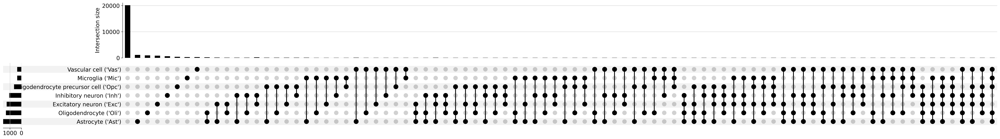

In [283]:
from upsetplot import plot
plot(counts_upset)  
from matplotlib import pyplot
pyplot.show()  

6. [Gene ontology](https://en.wikipedia.org/wiki/Gene_Ontology) provides a framework to label genes with standardized terms, or ontologies. GO analysis can help determine if specific functions or processes are statistically overrepresented among these genes compared to what would be expected by chance in the genome. This enrichment analysis helps to hypothesize mechanisms potentially driving changes observed in the dataset, such as those involved in a disease state or developmental process. In studies of neurodegenerative diseases like Alzheimer's, GO analysis might reveal an enrichment of genes involved in pathways like synaptic signaling or immune response, highlighting these processes as areas of interest for potential therapeutic interventions.

    We take differential expression results from DESeq2 and obtain functional enrichments with gprofiler2. To do so:
    - take upregulated and downregulated (log2FC > 0 and log2FC < 0) genes for every function, using FDR threshold of 0.05.
    - use `Gprofiler` to get information for those geens
    - get score for every cell: get mean from overexpressed genes; split distribution of counts in the rest gens into bins, take fair number of genes from every bin and calculate mean; calculate diff deregulated minus control

In [ ]:
def run_go(df, log2FC_col:str="log2FC", padj_col:str="p_adjust", min_log2FC:float=0., max_padj:float=0.05) -> pd.DataFrame:
    """For significant genes, add upregulated genes (log2FC > min_log2FC) and downregulated genes (log2FC < -min_log2FC)
    to query, and send to gprofiler2.
    """
    up_genes = df[df[log2FC_col] > min_log2FC].index.tolist()
    down_genes = df[df[log2FC_col] < -min_log2FC].index.tolist()
    print(f"Upregulated genes: {len(up_genes)}, Downregulated genes: {len(down_genes)}")
    gp = GProfiler(return_dataframe=True)
    query = {}
    query["Up"] = up_genes
    query["Down"] = down_genes
    return gp.profile(query=query, combined=True)

def run_all_go(tbl) -> pd.DataFrame:
  """Run GO for all cell types, using deg_out from part 2 as input. Modify arguments to run_go as needed"""
  out = {}
  for ct, df in tbl.items():
    df_temp = df.results_df
    thr = df_temp['log2FoldChange'].quantile(0.975)
    out[ct] = run_go(df.results_df, log2FC_col="log2FoldChange", min_log2FC=thr) ### Only look at the top 2.5% of genes
  return pd.concat(out).reset_index(drop=True).drop_duplicates(subset=['name'])

In [303]:
go_result = run_all_go(deg_out)

Upregulated genes: 608, Downregulated genes: 441
Upregulated genes: 426, Downregulated genes: 262
Upregulated genes: 245, Downregulated genes: 272
Upregulated genes: 437, Downregulated genes: 564
Upregulated genes: 321, Downregulated genes: 192
Upregulated genes: 361, Downregulated genes: 264
Upregulated genes: 191, Downregulated genes: 149


In [304]:
go_result

,source,native,name,p_values,description,term_size,query_sizes,intersection_sizes,effective_domain_size,parents
0,GO:BP,GO:0048709,oligodendrocyte differentiation,"[9.757191251660191e-17, 1.0]","""The process in which a relatively unspecializ...",109,"[319, 118]","[23, 1]",21026,"[GO:0007417, GO:0010001]"
1,GO:BP,GO:0032501,multicellular organismal process,"[2.1624941689952824e-16, 1.0]","""Any biological process, occurring at the leve...",7322,"[319, 118]","[190, 58]",21026,[GO:0008150]
2,GO:BP,GO:0042063,gliogenesis,"[1.7656473393201693e-14, 1.0]","""The process that results in the generation of...",352,"[319, 118]","[34, 4]",21026,[GO:0022008]
3,GO:BP,GO:0048713,regulation of oligodendrocyte differentiation,"[3.780062500678659e-13, 1.0]","""Any process that modulates the frequency, rat...",47,"[319, 118]","[15, 1]",21026,"[GO:0045685, GO:0048709]"
4,GO:BP,GO:0010001,glial cell differentiation,"[1.4329319623952956e-12, 1.0]","""The process in which a relatively unspecializ...",264,"[319, 118]","[28, 3]",21026,"[GO:0030154, GO:0042063]"
...,...,...,...,...,...,...,...,...,...,...
1499,GO:BP,GO:0061564,axon development,"[0.03350248598771392, 1.0]","""The progression of an axon over time. Covers ...",528,"[164, 109]","[15, 4]",21026,[GO:0031175]
1501,GO:BP,GO:0010738,regulation of protein kinase A signaling,"[0.03702692803710107, 1.0]","""Any process that modulates the rate, frequenc...",21,"[164, -1]","[4, -1]",21026,"[GO:0010737, GO:1902531]"
1505,KEGG,KEGG:05166,Human T-cell leukemia virus 1 infection,"[0.03901627926357137, 1.0]",Human T-cell leukemia virus 1 infection,218,"[89, 54]","[9, 1]",8484,[KEGG:00000]
1509,GO:BP,GO:0098754,detoxification,"[0.04353793295636859, 1.0]","""Any process that reduces or removes the toxic...",149,"[164, 109]","[8, 1]",21026,"[GO:0008150, GO:0009636]"


For microglia, the subtraction of upregulated score from downregulate score computes a background gene set to make sure gene level counts aren't influenced by counts.

In [319]:
def load_microglia(path:str="RNA_Annotated.h5ad") -> anndata.AnnData:
  """You should log-normalize the data and return it"""
  mic = anndata.read_h5ad("RNA_Annotated.h5ad", backed="r")
  mic = mic[mic.obs["CellType"] == "Microglia ('Mic')", :].to_memory()
  sc.pp.filter_genes(mic, min_cells=3)
  sc.pp.normalize_total(mic, target_sum=1e4)
  sc.pp.log1p(mic)
  return mic

def add_deg_score(adata:anndata.AnnData, up_genes:List[str], down_genes:List[str], key_added:str="deg_score"):
  """Add a DEG score by subtracting the score_genes for up DEGs and the score_genes for down DEGs, on log normalized data"""
  sc.tl.score_genes(adata, gene_list=up_genes, score_name="up")
  sc.tl.score_genes(adata, gene_list=down_genes, score_name="down")
  adata.obs[key_added] = adata.obs["up"] - adata.obs["down"]

In [329]:
def plot_score_distribution(obs:pd.DataFrame, sample_col:str="library_id", pathology_col:str="Pathologic_diagnosis_of_AD",
                            score_column:str="scores"):
    """Summarize the scores by a boxplot or violin plot, summarizing per sample, and coloring the boxplot or violin plot by AD status.
    Plotnine/seaborn may be more feature rich than sc.pl.violin or sc.pl.boxplot, but you can probably get them to work.
    Use adata.obs for the first argument."""
    data = obs.groupby(sample_col)[[pathology_col, score_column]].agg({
        pathology_col: 'first',
        score_column: 'sum'
    }).reset_index()
    import seaborn as sns
    import matplotlib.pyplot as plt
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=pathology_col, y=score_column, data=data)
    plt.title(f"Distribution of {score_column} by  {pathology_col}")
    plt.xlabel(pathology_col)
    plt.ylabel(score_column)
    plt.legend(title=pathology_col)
    plt.tight_layout()


/tmp/ipykernel_1049/2532952090.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


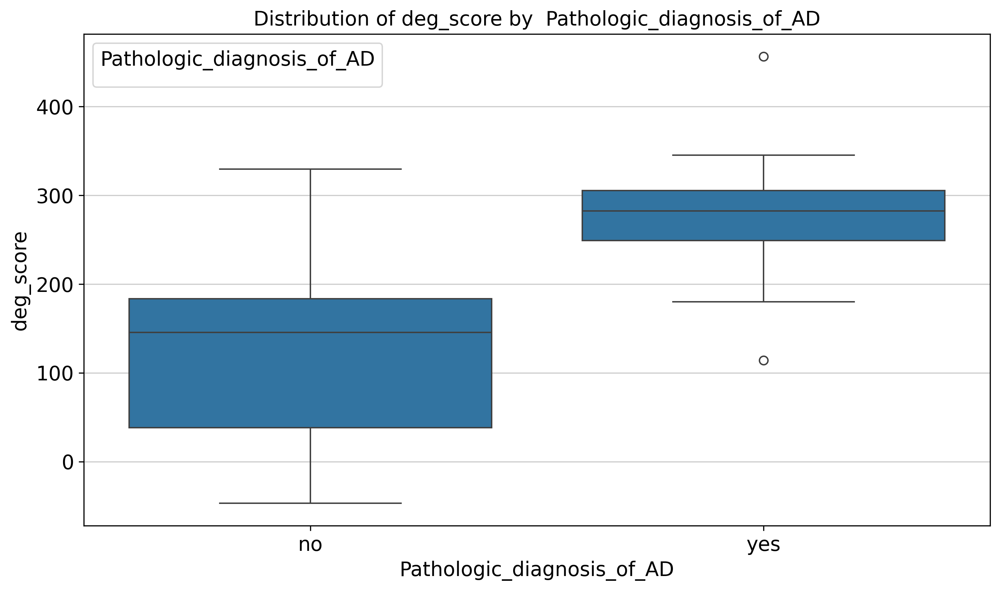

In [330]:
data = load_microglia()
add_deg_score(data, up_genes, down_genes, key_added="deg_score")
plot_score_distribution(data.obs, sample_col="library_id", pathology_col="Pathologic_diagnosis_of_AD", score_column="deg_score")

# **3. snATAC-seq analysis**

While the transcriptome provides crucial insights into which genes are active in a cell, it doesn’t reveal everything about gene regulation. Another critical layer of understanding comes from examining the accessibility of the genome itself — specifically, which regions are open and accessible to transcription factors and other regulatory molecules. This is where ATAC-seq (Assay for Transposase-Accessible Chromatin using sequencing) comes into play.

What is ATAC-seq? ATAC-seq is a technique used to assess genome-wide chromatin accessibility. It works by using a transposase enzyme to insert a sequencing adapter into open and accessible regions of the genome. These accessible regions often correlate with active gene regulation, providing insights beyond what gene expression can tell us. The sequenced regions highlight parts of the DNA that are not tightly wrapped around histones or blocked by other proteins, thus accessible for transcription machinery to initiate the process of gene expression.

Single-Nucleus ATAC-seq (snATAC-seq): Expanding on the standard ATAC-seq, snATAC-seq is adapted to work with droplet-based technology like snRNA-seq to tag nuclei instead of a whole tissue. SnATAC-seq provides a high-resolution view of chromatin accessibility at the single-nucleus level, allowing researchers to explore cellular heterogeneity in gene regulation within complex tissues.

- snATAC-seq helps us understand how different regions of the genome are regulated across different cells and conditions. For example, in neurodegenerative diseases like Alzheimer's, understanding changes in chromatin accessibility can shed light on the regulatory mechanisms that might be disrupted.
- By mapping which parts of the genome are open and which are closed, researchers can predict which genes are likely to be active and which are silenced, complementing the data obtained from RNA sequencing.

In our analysis, we will utilize snATAC-seq data to uncover gene regulatory mechanisms across various samples. The goal is to use this data to identify potential regulatory elements that might be critical in disease pathology or cellular function in different states.

That part closely follows the one: https://muon-tutorials.readthedocs.io/en/latest/single-cell-rna-atac/pbmc10k/2-Chromatin-Accessibility-Processing.html

In [352]:
def download_atac_seq_dataset():
    """
    Download and load the single-nucleus ATAC sequencing (snATAC-seq) dataset as an AnnData object.

    This dataset is retrieved from a specified URL and loaded into an AnnData object,
    which is tailored for storing large datasets typical in high-throughput genomics such as ATAC-seq.
    ATAC-seq data provides insights into chromatin accessibility across the genome.

    Returns:
    --------
    adata : AnnData
        An AnnData object containing the downloaded snATAC-seq data. Key components include:

        - .X : A data matrix (nuclei × genomic regions) of accessibility counts.
        - .obs : DataFrame with one row per nucleus and columns for various nucleus-level annotations such as
                 sample information, quality metrics, and biological conditions.
        - .var : DataFrame with one row per genomic region and columns for genomic coordinates and other features.
        - .uns : Unstructured dictionary-like attribute for miscellaneous data related to the dataset such as
                 dimensionality reduction outputs and clustering information.
        - .obsm : Dictionary-like structure for storing arrays that annotate observations (nuclei), e.g., embeddings like UMAP.
        - .varm : Dictionary-like structure for storing arrays that annotate variables (genomic regions).
        - .obsp : Pairwise annotation of observations as a sparse matrix.
        - .varp : Pairwise annotation of variables as a sparse matrix.

    Example:
    --------
    adata = download_atac_seq_dataset()
    print(adata)  # This will show you the structure of the loaded AnnData object.
    """
    !wget -c https://compbio.mit.edu/benjames/MFC_ATAC.h5ad -O MFC_ATAC.h5ad
    adata = anndata.read_h5ad("MFC_ATAC.h5ad", backed="r")
    return adata

adata = download_atac_seq_dataset()

280738.96s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


--2025-07-12 23:05:16--  https://compbio.mit.edu/benjames/MFC_ATAC.h5ad
Resolving compbio.mit.edu (compbio.mit.edu)... 128.52.131.233
Connecting to compbio.mit.edu (compbio.mit.edu)|128.52.131.233|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1668933212 (1.6G)
Saving to: ‘MFC_ATAC.h5ad’

MFC_ATAC.h5ad       100%[===================>]   1.55G  10.4MB/s    in 2m 35s  

2025-07-12 23:07:52 (10.2 MB/s) - ‘MFC_ATAC.h5ad’ saved [1668933212/1668933212]



In [369]:
from scipy.stats import pearsonr

## 3.1 Preprocessing

We start with similar workflow as it was for scRNA-seq. The differences are:
- Instead of genes we talk about TSS (transcription start site) place, where enzyme binds. Therefore, the analysis - is the analysis on binding sites' counts over the DNA.
- Use SVD of TF-IDF for filtering. Since we analyse chromatin accessibity, some parts, that equivalent to chromatin turn, are very frequent (like functional words in english). We want to analyse only meaningful sites.

The preprocessing flow:
- filter out low quality cells
- normalize and counts to contineous values transformation with log1p, batch normalization with harmony
- run PCA or LSI (latent semantic indexing) and compute neighbourhood graph
- perform clastering for cells annotation 
- take Microglia cells and perform cells scoring

In [353]:
adata

AnnData object with n_obs × n_vars = 182698 × 105643 backed at 'MFC_ATAC.h5ad'
    obs: 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'library_id', 'subject', 'msex', 'age_death', 'pmi', 'race', 'Pathologic_diagnosis_of_AD', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts'
    var: 'Chromosome', 'Start', 'End', 'width', 'strand', 'score', 'replicateScoreQuantile', 'groupScoreQuantile', 'Reproducibility', 'GroupReplicate', 'distToGeneStart', 'nearestGene', 'peakType', 'distToTSS', 'nearestTSS', 'GC', 'idx', 'N', 'interval', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'gc_bias'
    uns: 'lsi', 'neighbors', 'peak_seq', 'umap'
    obsm: 'X_lsi', 'X_umap'
    varm: 'LSI', 'bg_peaks'
    obsp: 'connectivities', 'distances'

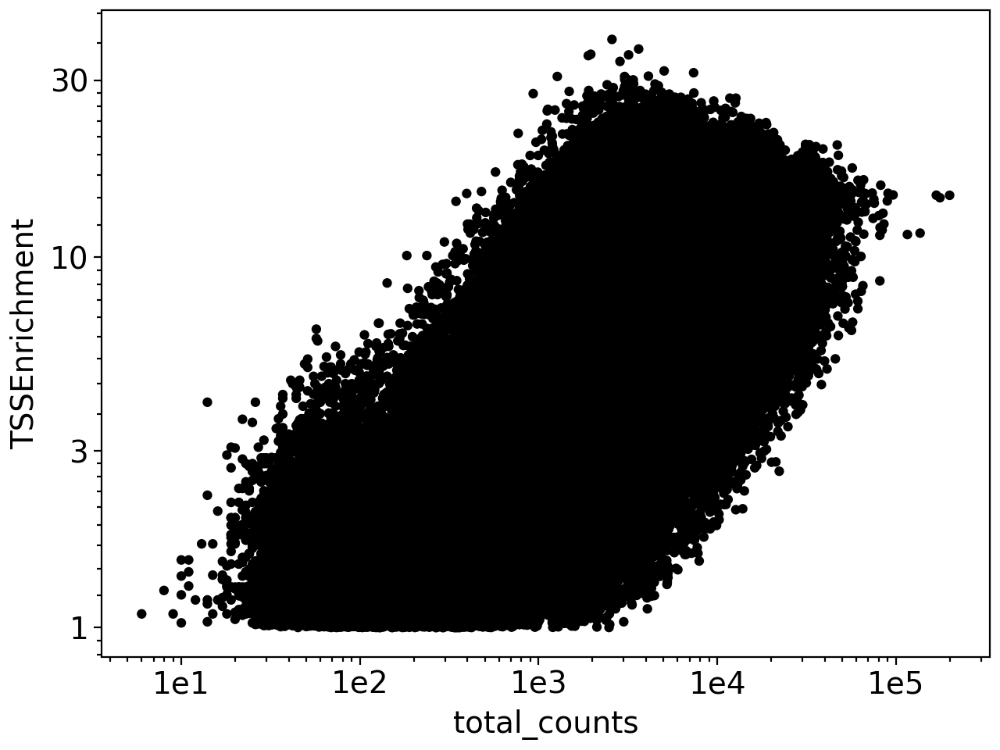

In [354]:
ggplot(adata.obs, aes(y="TSSEnrichment", x="total_counts")) + geom_point() + scale_x_log10() + scale_y_log10()

In [355]:
def quality_control_atac_seq(adata: anndata.AnnData, min_total_counts: int = 500) -> anndata.AnnData:
    """
    Perform quality control on single-nucleus ATAC-seq data by filtering out nuclei based on total read counts.

    Parameters:
    -----------
    adata : anndata.AnnData
        An AnnData object containing single-nucleus ATAC-seq data with observations in rows and genomic regions in columns.

    min_total_counts : int, optional (default=500)
        The minimum number of total reads (counts) required for a nucleus to be considered for further analysis. Nuclei with
        fewer than this number of total counts are removed from the dataset to ensure data quality and reliability.

    Returns:
    --------
    adata : anndata.AnnData
        The filtered AnnData object where nuclei with low total counts have been removed. This dataset is more likely to
        represent biologically relevant and technically reliable data, as it excludes nuclei with potentially poor quality
        sequencing or insufficient chromatin accessibility.
    """
    # Filter nuclei based on the total counts, such that cells with total counts
    # less than min_total_counts are excluded (equivalently, cells with more than min_total_counts are kept)
    adata = adata[adata.obs["total_counts"] >= min_total_counts, :]

    # Save the filtered data to an H5AD file with compression
    adata.write_h5ad("MFC_ATAC_QC.h5ad", compression="gzip")

    # Reload the data from the compressed file in backed mode
    adata = anndata.read_h5ad("MFC_ATAC_QC.h5ad", backed="r")

    return adata

adata = quality_control_atac_seq(adata, min_total_counts=500)

In [370]:
def refine_atac_seq_data(adata: anndata.AnnData, qc_metrics:List[str]) -> anndata.AnnData:
    """
    Refine ATAC-seq data by removing LSI components strongly correlated with a specified quality control metric and performing batch correction using Harmony.

    Parameters:
    -----------
    adata : anndata.AnnData
        The AnnData object containing single-nucleus ATAC-seq data, which includes LSI components in `obsm['X_lsi']` and batch labels in `obs['library_id']`.

    qc_metric : str
        The name of the quality control metric in `adata.obs` used to assess the correlation with LSI components. High correlation suggests that the component may be driven more by technical variation than biological signal.

    Returns:
    --------
    adata : anndata.AnnData
        The AnnData object with the LSI space refined by removing components highly correlated with the QC metric and integrated over batches using Harmony.

    Notes:
    ------
    - This function does not recompute LSI, but rather filters out components from the existing LSI representation.
    - Batch correction is performed using Harmony, which adjusts the LSI space to minimize batch effects while retaining biological variance.
    """
    bad_indices = set()
    # Check correlation of each LSI component with the specified QC metric
    for met in qc_metrics:
        for i in range(adata.obsm["X_lsi"].shape[1]):
            correlation, _ = pearsonr(adata.obsm["X_lsi"][:, i], adata.obs[met])
            if abs(correlation) > 0.8:  # Threshold for strong correlation
                bad_indices.add(i)

    # Filter out the bad LSI components
    good_indices = [i for i in range(adata.obsm["X_lsi"].shape[1]) if i not in bad_indices]
    adata.obsm["X_lsi"] = adata.obsm["X_lsi"][:, good_indices]

    # Apply Harmony for batch correction
    sc.external.pp.harmony_integrate(adata, key="library_id", basis="X_lsi", adjusted_basis="X_lsi_harmony")

    # Update the neighborhood graph using the harmonized LSI components
    sc.pp.neighbors(adata, use_rep="X_lsi_harmony")

    # Compute UMAP and leiden
    sc.tl.umap(adata)
    sc.tl.leiden(adata)
    return adata

# Example of usage
adata = refine_atac_seq_data(adata, qc_metrics=['total_counts'])

2025-07-13 00:31:14,671 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-13 00:31:24,369 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-13 00:31:25,002 - harmonypy - INFO - Iteration 1 of 10
2025-07-13 00:32:18,274 - harmonypy - INFO - Iteration 2 of 10
2025-07-13 00:33:18,597 - harmonypy - INFO - Converged after 2 iterations


In [396]:
gene_types = adata.var["GroupReplicate"].str.split("._.", expand=True)
gene_types['gene'] = adata.var["nearestGene"]
gene_types["count"] = adata.var["total_counts"]

In [415]:
genes_check = ["CSF1R", "P2RY12", "AIF1"]
vars_select = gene_types[gene_types["gene"].isin(genes_check) & gene_types[0].eq("Microglia")].index.tolist()

In [381]:
adata.var

,Chromosome,Start,End,width,strand,score,replicateScoreQuantile,groupScoreQuantile,Reproducibility,GroupReplicate,...,idx,N,interval,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,gc_bias
chr6:63572249-63572749,chr6,63572249,63572749,501,*,230.08987,1.0,0.999,5,Ex._.D19-13182,...,9,0,chr6:63572249-63572749,19374,0.159865,0.148304,89.395615,29207,10.282198,0.706
chr6:42984094-42984594,chr6,42984094,42984594,501,*,222.33484,1.0,0.999,5,Ex._.D19-13182,...,4,0,chr6:42984094-42984594,14988,0.117319,0.110932,91.796298,21434,9.972780,0.576
chr6:62286037-62286537,chr6,62286037,62286537,501,*,228.14713,1.0,0.999,5,Ex._.D19-13182,...,8,0,chr6:62286037-62286537,8744,0.066235,0.064134,95.213960,12101,9.401126,0.652
chr6:85678554-85679054,chr6,85678554,85679054,501,*,161.71384,1.0,0.999,5,Ex._.D19-13157,...,11,0,chr6:85678554-85679054,14591,0.115234,0.109064,92.013596,21053,9.954846,0.620
chr6:80106395-80106895,chr6,80106395,80106895,501,*,169.94710,1.0,0.999,5,Ex._.D19-13157,...,10,0,chr6:80106395-80106895,13731,0.107943,0.102505,92.484318,19721,9.889490,0.672
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chr1:26532373-26532873,chr1,26532373,26532873,501,*,116.47778,0.9,0.868,5,Ast._.D19-13182,...,1858,0,chr1:26532373-26532873,1566,0.011434,0.011369,99.142848,2089,7.644919,0.596
chr1:25232272-25232772,chr1,25232272,25232772,501,*,116.47778,0.9,0.868,5,Ast._.D19-13182,...,1856,0,chr1:25232272-25232772,7216,0.053969,0.052563,96.050313,9860,9.196343,0.584
chr11:116263679-116264179,chr11,116263679,116264179,501,*,36.82433,0.9,0.856,5,Ex._.D19-125455,...,1846,0,chr11:116263679-116264179,1378,0.009830,0.009782,99.245750,1796,7.493874,0.542
chr20:62065808-62066308,chr20,62065808,62066308,501,*,36.82433,0.9,0.856,5,Ex._.D19-125455,...,794,0,chr20:62065808-62066308,8148,0.061380,0.059570,95.540181,11214,9.325007,0.832


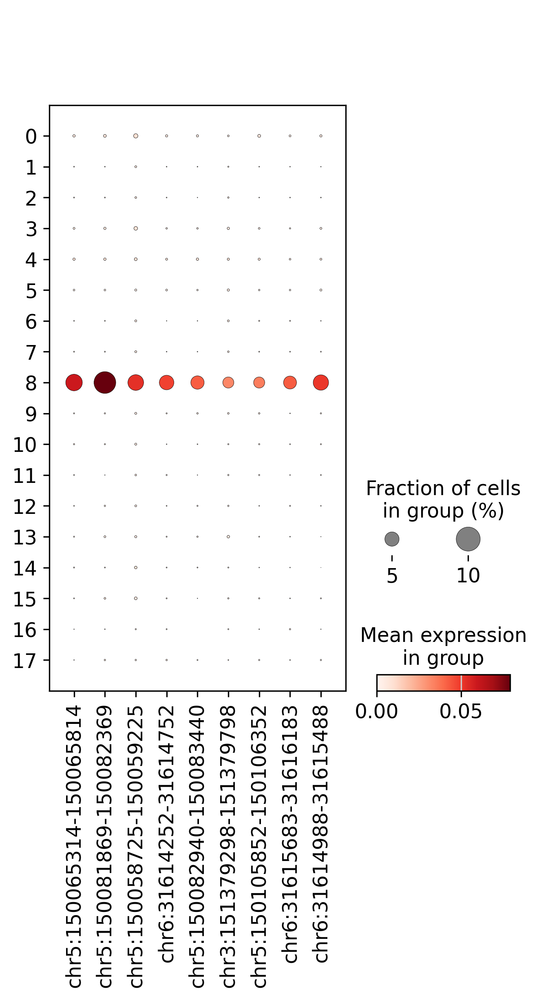

AnnData object with n_obs × n_vars = 160171 × 9
    obs: 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'library_id', 'subject', 'msex', 'age_death', 'pmi', 'race', 'Pathologic_diagnosis_of_AD', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'leiden'
    var: 'Chromosome', 'Start', 'End', 'width', 'strand', 'score', 'replicateScoreQuantile', 'groupScoreQuantile', 'Reproducibility', 'GroupReplicate', 'distToGeneStart', 'nearestGene', 'peakType', 'distToTSS', 'nearestTSS', 'GC', 'idx', 'N', 'interval', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'gc_bias'
    uns: 'lsi', 'neighbors', 'peak_seq', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_lsi', 'X_umap', 'X_lsi_harmony'
    varm: 'LSI', 'bg_peaks'
    obsp: 'connectivities', '

In [417]:
plot_markers(adata, groupby="leiden", markers=vars_select)

In [421]:
celltype_table_atac = {"Microglia ('Mic')": ["8"],}
adata = assign_celltypes(adata, **celltype_table_atac)

ATAC-seq Data Structure and Peaks: ATAC-seq provides a snapshot of chromatin accessibility across the genome. The technique identifies regions where the chromatin is "open" and thus accessible to transcription factors and other regulatory proteins. These open regions are detected as "peaks" in the ATAC-seq data. Each peak corresponds to a specific start and end point on the genome where the chromatin is less condensed, indicating potential regulatory activity.


In [431]:
def analyze_differential_accessibility(adata: anndata.AnnData, groupby: str):
    """
    Analyze differentially accessible genomic peaks in microglia from ATAC-seq data using PyDESeq2 and visualize the results in a volcano plot.

    Parameters:
    -----------
    adata : anndata.AnnData
        The input AnnData object containing ATAC-seq data. This data should include 'peak' data in `.var` and the accessibility matrix in `.X`.
        Additionally, `adata.obs` must contain a column specifying the sample or condition grouping and a column identifying microglia cells.

    groupby : str
        The name of the column in `adata.obs` to be used for grouping the data in the differential accessibility analysis. This typically will be a
        condition label such as 'disease_status' that differentiates between experimental groups (e.g., 'control' vs 'Alzheimer's').

    Returns:
    --------
    None
        This function does not return a value but generates a volcano plot as output. The plot displays log2 fold changes on the x-axis against
        -log10 p-values on the y-axis, with points colored by chromosome to highlight chromosomal patterns of accessibility differences.

    Notes:
    ------
    - The function filters for microglia cells before proceeding with the analysis. Ensure that `adata.obs` includes an appropriate identifier for cell types.
    - Differential accessibility analysis is performed using PyDESeq2, which requires count data and group labels.
    - The volcano plot is helpful for visualizing statistically significant peaks with considerable changes in accessibility between groups.
    - Points in the volcano plot are colored based on their chromosome, which must be included in the `adata.var` metadata.

    Example:
    --------
    >>> adata = anndata.read_h5ad("path_to_adata_file.h5ad")
    >>> analyze_differential_accessibility(adata, groupby='disease_status')
    """
    # Example pseudocode for the function body:
    # Filter the data to include only microglia cells
    # Use your code from (2)
    ps_mic = pseudobulk(adata[adata.obs["CellType"] == "Microglia ('Mic')", :], groupby=groupby)
    sc.pp.calculate_qc_metrics(ps_mic, inplace=True)

    # Perform differential accessibility analysis using PyDESeq2
    # This would involve setting up a DESeq2 dataset, running the analysis, and retrieving results
    result = run_deseq2(ps_mic, "Pathologic_diagnosis_of_AD", ['msex', 'age_death', 'pmi'], n_cpus=1)
    vis_result = result.results_df.copy()
    vis_result["chromosome"] = ps_mic.var["Chromosome"].values
    vis_result["gene"] = ps_mic.var["nearestGene"].values
    return vis_result
    

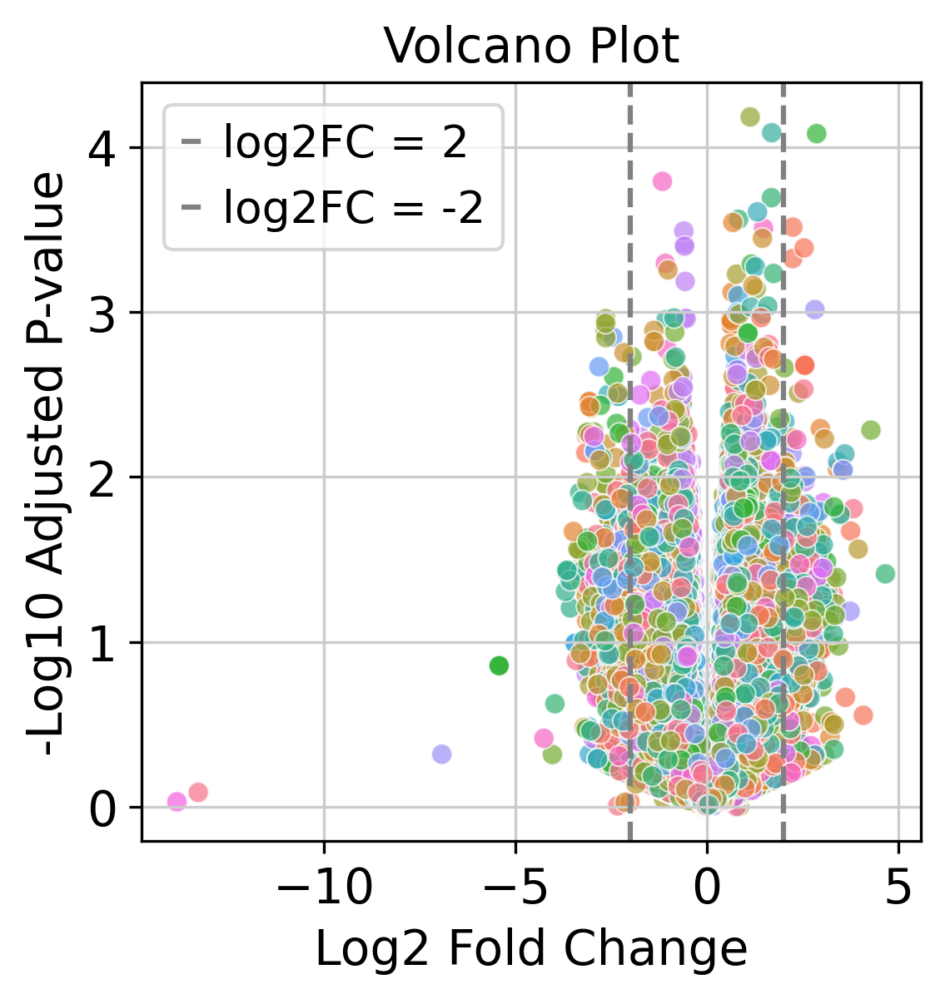

In [ ]:
result = analyze_differential_accessibility(adata, groupby='library_id')
volcano(result, gene_col="chromosome", log2FC_col="log2FoldChange", padj_col="pvalue")

In [443]:
def atac_preprocess(adata: anndata.AnnData) -> anndata.AnnData:
    if adata.isbacked: ### If using on-disk format, load into memory now.
        adata = adata.to_memory() 
    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    adata.layers["lognorm"] = adata.X.copy()
    return adata

def atac_type(adata: anndata.AnnData, cell_type: str, groupby: str) -> anndata.AnnData:
    """Filter the AnnData object to include only the specified cell type."""
    subdata = adata[adata.obs["CellType"] == cell_type, :].copy()
    sc.tl.rank_genes_groups(subdata, groupby, method='t-test')
    df = sc.get.rank_genes_groups_df(subdata, group="yes")
    df_comb = df.set_index("names")
    return df_comb.reset_index()

In [444]:
atac_pp = atac_preprocess(adata)
microglia_pp = atac_type(atac_pp, "Microglia ('Mic')", groupby="Pathologic_diagnosis_of_AD")

In [446]:
subdata = atac_pp[atac_pp.obs["CellType"] == "Microglia ('Mic')", :].copy()
subdata

AnnData object with n_obs × n_vars = 7173 × 105643
    obs: 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'library_id', 'subject', 'msex', 'age_death', 'pmi', 'race', 'Pathologic_diagnosis_of_AD', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'leiden', 'CellType'
    var: 'Chromosome', 'Start', 'End', 'width', 'strand', 'score', 'replicateScoreQuantile', 'groupScoreQuantile', 'Reproducibility', 'GroupReplicate', 'distToGeneStart', 'nearestGene', 'peakType', 'distToTSS', 'nearestTSS', 'GC', 'idx', 'N', 'interval', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'gc_bias'
    uns: 'lsi', 'neighbors', 'peak_seq', 'umap', 'leiden', 'leiden_colors', 'log1p'
    obsm: 'X_lsi', 'X_umap', 'X_lsi_harmony'
    varm: 'LSI', 'bg_peaks'
    l

In [445]:
microglia_pp

,names,scores,logfoldchanges,pvals,pvals_adj
0,chr3:48503915-48504415,4.634014,1.084627,3.670891e-06,8.675704e-04
1,chr10:6201433-6201933,3.740733,0.634006,1.851141e-04,7.379627e-03
2,chr10:6201430-6201930,3.740733,0.634006,1.851141e-04,7.379627e-03
3,chr11:134331710-134332210,3.729261,0.789973,1.938449e-04,7.595954e-03
4,chr11:134331716-134332216,3.668186,0.783477,2.464242e-04,8.745445e-03
...,...,...,...,...,...
105638,chr19:1407053-1407553,-6.815738,-0.805029,1.014478e-11,2.112029e-07
105639,chr19:1407190-1407690,-6.860789,-0.817077,7.423830e-12,1.960689e-07
105640,chrX:53684028-53684528,-6.950386,-0.976301,3.970615e-12,1.398226e-07
105641,chr19:1406968-1407468,-7.172692,-0.903391,8.098827e-13,4.277922e-08


In [459]:
down_peak_atac = (microglia_pp[microglia_pp['pvals_adj'].le(0.05) & microglia_pp['logfoldchanges'].lt(0)]
                .sort_values(by='logfoldchanges').iloc[:30,: ]['names'].values)
up_peak_atac = (microglia_pp[microglia_pp['pvals_adj'].le(0.05) & microglia_pp['logfoldchanges'].gt(0)]
                .sort_values(by='logfoldchanges').iloc[-30:,: ]['names'].values)


/tmp/ipykernel_1049/2532952090.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


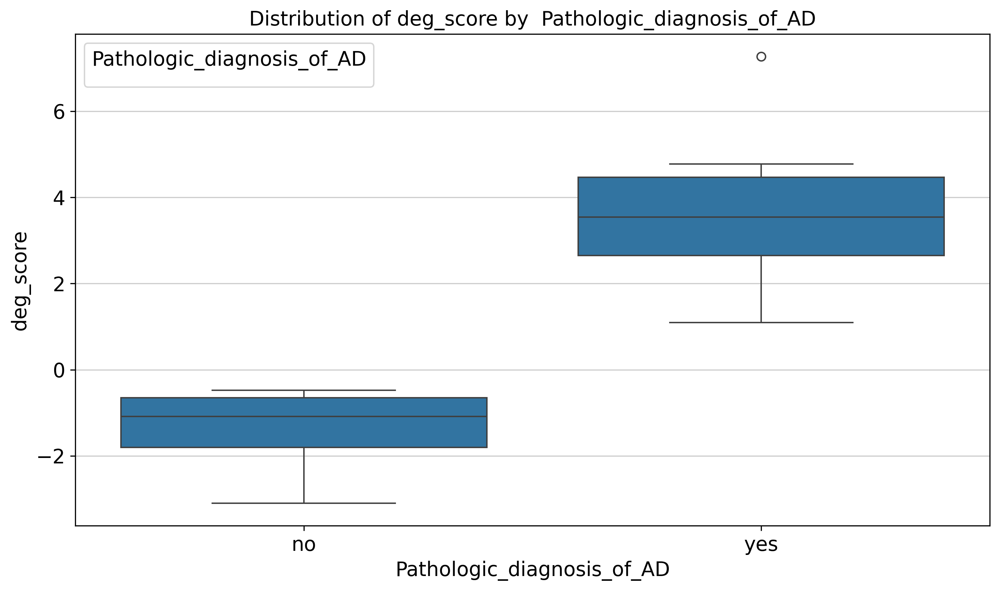

In [ ]:
microglia_rw = atac_pp[atac_pp.obs["CellType"] == "Microglia ('Mic')", :].copy()
add_deg_score(microglia_rw, up_peak_atac, down_peak_atac, key_added="deg_score")
plot_score_distribution(microglia_rw.obs, sample_col="library_id", pathology_col="Pathologic_diagnosis_of_AD", score_column="deg_score")

In [463]:
# Let's find an interseption between down and upregulated peaks in ATAC and RNA genes.
atac_down_genes = microglia_rw.var.loc[down_peak_atac, "nearestGene"].unique()
atac_up_genes = microglia_rw.var.loc[up_peak_atac, "nearestGene"].unique()

print(f"Number of downregulated peaks in ATAC that intersept with RNA genes: {len(set(atac_down_genes) & set(down_genes))}")
print(f"Number of downregulated peaks in ATAC that intersept with RNA genes: {len(set(atac_up_genes) & set(up_genes))}")

Number of downregulated peaks in ATAC that intersept with RNA genes: 0
Number of downregulated peaks in ATAC that intersept with RNA genes: 0


## 3.2 Additional analysis

1. Motif counting
    Given the DNA sequence for each peak, we will calculate the motif scoring function and compute how many motifs are in each peak.
    We’re interested in motif counting in snATAC-seq because it turns raw chromatin accessibility into biological insights about which transcription factors are driving cell-type identity and state. It’s one of the main steps in moving from “open peaks” → “regulatory interpretation.”. **Notice, some peaks have several motifs presented, meaning there are clusters of motifs favorable for binding TF (transcriptors factor)
2. [chromVar](https://www.nature.com/articles/nmeth.4401) scores - enrichment of the motif in particular cell, how ofter we can expect that motif accessible in the cell.

In [479]:
from Bio.Seq import Seq
from Bio.motifs.matrix import PositionSpecificScoringMatrix

In [ ]:
def compute_score_cutoff(motif:Bio.motifs.jaspar.Motif, precision:int=10000, pvalue=0.001):
  """Generates `precision` number of random DNA sequences under the distribution motif.background, 
  calculate PWM Score relative to uniform background, then picks the top 99.9% score if pvalue=0.001.
  """
  pwm = PositionSpecificScoringMatrix(list(motif.pwm.keys()), motif.pwm)
  background = motif.background
  random_sequences = [
      "".join(np.random.choice(list(background.keys()), p=list(background.values())) for _ in range(motif.length))
      for _ in range(precision)
  ]
  scores = [pwm.calculate(Seq(seq)) for seq in random_sequences]
  return np.percentile(scores, 100 * (1 - pvalue))

def score_motifs_sequences(motif:Bio.motifs.jaspar.Motif, sequences:List[str], pvalue=1e-3) -> np.ndarray:
  """For a Motif, compute the PWM score. Don't forget the reverse_complement() PWM scoring as well.
  You can use .pssm.search here, assuming you didn't use it for compute_score_cutoff.
  Return a list of integers representing the number of matches per sequence.
  """
  pwm = PositionSpecificScoringMatrix(list(motif.pwm.keys()), motif.pwm)
  score_threshold = compute_score_cutoff(motif, pvalue=pvalue)
  counts = []
  for seq in sequences:
      seq_obj = Seq(seq)
      forward_matches = sum(1 for _ in pwm.search(seq_obj, threshold=score_threshold))
      reverse_matches = sum(1 for _ in pwm.search(seq_obj.reverse_complement(), threshold=score_threshold))
      counts.append(forward_matches + reverse_matches)
  return np.array(counts)

adata.varm["motif_match"] = np.zeros((adata.shape[1], len(MOTIF_LIST)), dtype=np.int16)
adata.uns['motif_name'] = [None] * len(MOTIF_LIST)
for i, motif in enumerate(MOTIF_LIST):
  counts = score_motifs_sequences(motif, adata.uns["peak_seq"])
  adata.varm["motif_match"][:, i] = counts
  adata.uns['motif_name'][i] = motif.matrix_id + "." + motif.name

In [489]:
adata

AnnData object with n_obs × n_vars = 160171 × 105643 backed at 'MFC_ATAC_QC.h5ad'
    obs: 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'library_id', 'subject', 'msex', 'age_death', 'pmi', 'race', 'Pathologic_diagnosis_of_AD', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'leiden', 'CellType'
    var: 'Chromosome', 'Start', 'End', 'width', 'strand', 'score', 'replicateScoreQuantile', 'groupScoreQuantile', 'Reproducibility', 'GroupReplicate', 'distToGeneStart', 'nearestGene', 'peakType', 'distToTSS', 'nearestTSS', 'GC', 'idx', 'N', 'interval', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'gc_bias'
    uns: 'lsi', 'neighbors', 'peak_seq', 'umap', 'leiden', 'leiden_colors', 'motif_name'
    obsm: 'X_lsi', 'X_umap', 'X_lsi_harmon

In [490]:
adata.write_h5ad("MFC_ATAC_Motif.h5ad", compression="gzip")

In [ ]:
adata.varm['bg_peaks']

array([[     0,    109,  13531, ...,  27084,   5362,    941],
       [     1,  50980,  27723, ...,   1323,  11340,  10666],
       [ 55554,      2,  81885, ...,  52419,  67321,  33294],
       ...,
       [105640,  93560,  82149, ...,  35653, 104774,  61175],
       [105641,  44523,  48953, ...,  66788,  91518,  46069],
       [105642,  65832,  39719, ...,  90127,  92774,  70974]],
      shape=(105643, 50), dtype=int32)

In [498]:
adata.varm['motif_match']

array([[ 0,  0,  4, ..., 68,  4,  6],
       [ 0,  0,  2, ...,  4,  0,  4],
       [ 0,  0,  0, ..., 14,  2,  2],
       ...,
       [ 2,  0,  2, ...,  6,  0,  2],
       [ 0,  0,  0, ..., 64,  0,  6],
       [ 4,  2,  0, ...,  0,  0,  2]], shape=(105643, 720), dtype=int16)

In [491]:
adata.uns["motif_name"]

['MA0069.1.PAX6',
 'MA0071.1.RORA',
 'MA0074.1.RXRA::VDR',
 'MA0101.1.REL',
 'MA0107.1.RELA',
 'MA0115.1.NR1H2::RXRA',
 'MA0119.1.NFIC::TLX1',
 'MA0130.1.ZNF354C',
 'MA0149.1.EWSR1-FLI1',
 'MA0155.1.INSM1',
 'MA0159.1.RARA::RXRA',
 'MA0163.1.PLAG1',
 'MA0468.1.DUX4',
 'MA0258.2.ESR2',
 'MA0595.1.SREBF1',
 'MA0596.1.SREBF2',
 'MA0599.1.KLF5',
 'MA0613.1.FOXG1',
 'MA0636.1.BHLHE41',
 'MA0641.1.ELF4',
 'MA0042.2.FOXI1',
 'MA0033.2.FOXL1',
 'MA0153.2.HNF1B',
 'MA0486.2.HSF1',
 'MA0653.1.IRF9',
 'MA0655.1.JDP2',
 'MA0660.1.MEF2B',
 'MA0663.1.MLX',
 'MA0665.1.MSC',
 'MA0667.1.MYF6',
 'MA0669.1.NEUROG2',
 'MA0678.1.OLIG2',
 'MA0068.2.PAX4',
 'MA0083.3.SRF',
 'MA0009.2.TBXT',
 'MA0689.1.TBX20',
 'MA0691.1.TFAP4',
 'MA0696.1.ZIC1',
 'MA0713.1.PHOX2A',
 'MA0715.1.PROP1',
 'MA0724.1.VENTX',
 'MA0729.1.RARA',
 'MA0730.1.RARA',
 'MA0731.1.BCL6B',
 'MA0472.2.EGR2',
 'MA0736.1.GLIS2',
 'MA0737.1.GLIS3',
 'MA0741.1.KLF16',
 'MA0088.2.ZNF143',
 'MA0758.1.E2F7',
 'MA0770.1.HSF2',
 'MA0771.1.HSF4',
 'MA0

**ChromVar deviation score**

It may be helpful to look at source code online of chromVar or pychromVar.

In [ ]:
def compute_chromvar(adata:anndata.AnnData, motif_name:str, batch_size:int=5000):
  """For some motif `motif_name`, compute the ChromVar score, that is,
  compute for every cell the (observed - expected)/expected motif counts.
  We use chi-square normalization when computing expected counts, that is, we assume that every cell has the same distribution of peaks as the average cell.
  
  Repeat this for background peaks as well, and compute the z-score of the real score using the background scores.
  """
  idx = adata.uns['motif_name'].index(motif_name)
  matches = adata.varm["motif_match"][:, idx].astype(np.int32)
  exp_var = adata.var["total_counts"].values[None, :] / adata.var["total_counts"].sum()
  exp_obs = adata.obs["total_counts"].values[:, None]

  def compute_deviations(X: np.ndarray, matches: np.ndarray, exp_obs: np.ndarray, exp_var: np.ndarray):
    """Compute the deviations for the given data."""
    observed = X.dot(matches) # motif counts in every cell
    expected = exp_obs @ (exp_var @ matches) # if we suppose that every cell has the same distribution of peaks as the average cell, then this is the expected number of motifs in every cell
    out_chunk = np.zeros_like(observed).astype(np.float32)
    raw_deviation = np.divide(observed - expected, expected, where=expected != 0, out=out_chunk)
    return raw_deviation

  obs_dev = np.zeros((adata.n_obs, ), dtype=np.float32)
  bg_dev = np.zeros(shape=(50, adata.n_obs), dtype=np.float32)
  for X, start, end in tqdm(adata.chunked_X(batch_size)):
    X = X.astype(np.int32)
    obs_dev[start:end] = compute_deviations(X, matches, exp_obs[start:end], exp_var)
    for j in range(50): # background peaks were computed 50 times for every peak
        bg_peak_idx = adata.varm['bg_peaks'][:, j] # every iteration is the set of random peaks taken from the same chromosome and with the same accessibility
        bg_motif_match = matches[bg_peak_idx]
        bg_dev[j, start:end] = compute_deviations(X, bg_motif_match, exp_obs[start:end], exp_var)


  z_score = (obs_dev - np.mean(bg_dev, axis=0)) / np.std(bg_dev, axis=0)
  z_score = np.nan_to_num(z_score, 0)
  adata.obs[motif_name] = z_score
  return adata


In [530]:
compute_chromvar(adata, 'MA1716.2.ZNF76', batch_size=5000)

0it [00:00, ?it/s]

33it [01:51,  3.38s/it]


AnnData object with n_obs × n_vars = 160171 × 105643 backed at 'MFC_ATAC_Motif.h5ad'
    obs: 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'ReadsInBlacklist', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'BlacklistRatio', 'library_id', 'subject', 'msex', 'age_death', 'pmi', 'race', 'Pathologic_diagnosis_of_AD', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'leiden', 'CellType', 'MA1716.2.ZNF76'
    var: 'Chromosome', 'Start', 'End', 'width', 'strand', 'score', 'replicateScoreQuantile', 'groupScoreQuantile', 'Reproducibility', 'GroupReplicate', 'distToGeneStart', 'nearestGene', 'peakType', 'distToTSS', 'nearestTSS', 'GC', 'idx', 'N', 'interval', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'gc_bias'
    uns: 'lsi', 'neighbors', 'peak_seq', 'umap', 'leiden', 'leiden_colors', 'motif_name'
    obsm: 'X_lsi', 'X